In [1]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import random
from IPython.display import display

In [ ]:
# from sklearn.feature_selection import f_regression

# from sklearn.linear_model import LinearRegression
# from sklearn.linear_model import Ridge
# from sklearn.linear_model import Lasso
# from sklearn.linear_model import ElasticNet

# from sklearn.model_selection import train_test_split
# from sklearn.model_selection import GridSearchCV
# from sklearn.model_selection import KFold
# from sklearn.model_selection import cross_val_score

# from sklearn.metrics import r2_score
# from sklearn.metrics import mean_squared_error
# from sklearn.metrics import mean_absolute_error

# from sklearn.ensemble import RandomForestRegressor

# from sklearn.impute import SimpleImputer

# from sklearn.preprocessing import StandardScaler
# from sklearn.preprocessing import OneHotEncoder

# from sklearn.compose import ColumnTransformer

# from sklearn.pipeline import Pipeline

# from statsmodels.stats.outliers_influence import variance_inflation_factor

# import xgboost as xgb

In [2]:
#pd.set_option('display.max_columns', 20)

In [4]:
Ames_HousePrice = pd.read_csv('Ames_HousePrice.csv', index_col=0)
real_coords = pd.read_csv("real_estate_with_coordinates.csv")

/var/folders/5v/y3sknb9x0fzg1jwjw5jw77tm0000gn/T/ipykernel_3534/2706010473.py:2: DtypeWarning: Columns (35,39,80,86) have mixed types. Specify dtype option on import or set low_memory=False.
  real_coords = pd.read_csv("real_estate_with_coordinates.csv")


In [5]:
# One row is duplicated in Ames_HousePrice df, once dropped there are no duplicate PID values
Ames_HousePrice = Ames_HousePrice.drop_duplicates()
real_coords = real_coords.drop_duplicates()

In [6]:
real_estate_columns_to_keep = ['GeoRefNo','Prop_Addr', 'MA_Zip1','latitude', 'longitude']

housing_coords = pd.merge(Ames_HousePrice, real_coords[real_estate_columns_to_keep],
                               left_on='PID', right_on='GeoRefNo', how='left')

housing_coords = housing_coords.drop_duplicates()

In [7]:
# Drop Columns with too many NA Values
housing_coords.drop(['PoolQC', 'MiscFeature', 'Alley', 'Fence'],axis=1,inplace=True)


In [8]:
# Coordinates of Iowa State University
isu_latitude = 42.0239
isu_longitude = -93.6476

# Function to calculate Haversine distance
def haversine(lat1, lon1, lat2, lon2):
    # Radius of the Earth in miles
    radius = 3958.8
    
    # Convert latitude and longitude from degrees to radians
    lat1 = np.radians(lat1)
    lon1 = np.radians(lon1)
    lat2 = np.radians(lat2)
    lon2 = np.radians(lon2)
    
    # Differences in latitude and longitude
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    
    # Haversine formula
    a = np.sin(dlat / 2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2)**2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
    
    # Calculate the distance
    distance = radius * c
    return distance

# Calculate distance for each property address
housing_coords['DistanceToISU'] = housing_coords.apply(
    lambda row: haversine(row['latitude'], row['longitude'], isu_latitude, isu_longitude), axis=1)

# Now, 'DistanceToISU' column contains the distance of each property to Iowa State University


In [9]:
# Remove missing gps data rows:
housing_coords = housing_coords.dropna(subset=['latitude'])

# 2 rows with gps info but missing zip:
specified_addresses = ['2010 KILDEE ST', '1310 WOODSTOCK AVE']

# Update 'Zipcode' to 50014 where 'Address' is in the specified list
housing_coords.loc[housing_coords['Prop_Addr'].isin(specified_addresses), 'MA_Zip1'] = 50014

# Reset index after dropping rows so flitering by iloc works smoothly
housing_coords.reset_index(drop=True,inplace=True)

In [10]:
# Added PricePerSF Column
housing_coords['PricePerSF'] = housing_coords['SalePrice'] / housing_coords['GrLivArea']

In [11]:
# DELETE UTILITIES COLUMN, it has 2496/2497 with same value
    # housing_coords.Utilities.value_counts() # <-- No N/As here
housing_coords.drop('Utilities',axis=1,inplace=True)

In [12]:
# Fix Row with Missing Values in Basement Categories
housing_coords.loc[housing_coords.PID==903230120,[
    'BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF',
    'BsmtFullBath','BsmtHalfBath']] = housing_coords.loc[housing_coords.PID==903230120,[
    'BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF','BsmtFullBath','BsmtHalfBath']].fillna(0)

In [13]:
# Masonry Veneer (Type/Area)
    # If Type = 'None' but Area != 0, Type updated to mode
    # N/As updated to None for Type and 0 for Area
idx = (housing_coords['MasVnrArea'].isna()) & (housing_coords['MasVnrType'].isna())

housing_coords.loc[idx, 'MasVnrArea'] = housing_coords.loc[idx, 'MasVnrArea'].fillna(0)
housing_coords.loc[idx, 'MasVnrType'] = housing_coords.loc[idx, 'MasVnrType'].fillna('None')

mode_MasVnrType = housing_coords.loc[housing_coords.MasVnrType!='None'].MasVnrType.mode()[0]

idx2 = (housing_coords['MasVnrArea']!=0) & (housing_coords['MasVnrType']== 'None')
housing_coords.loc[idx2, 'MasVnrType'] = housing_coords.loc[idx2, 'MasVnrType'].fillna(mode_MasVnrType)

In [14]:
# Fix Row with Missing Values in GarageCars & GarageArea Categories
idx3 = (housing_coords['GarageArea']!=0) & (housing_coords['GarageType']=='Detchd')
mean_GarageArea = round(housing_coords.loc[idx3, 'GarageArea'].mean())
housing_coords.loc[housing_coords.PID==910201180,'GarageArea'] = mean_GarageArea

idx4 = housing_coords['GarageType']=='Detchd'
mode_GarageCars = housing_coords.loc[idx4, 'GarageCars'].mode()[0]
housing_coords.loc[housing_coords.PID==910201180,'GarageCars'] = mode_GarageCars

In [15]:
# Fill GarageYrBlt to match Year House Was Built
housing_coords['GarageYrBlt'] = housing_coords['GarageYrBlt'].fillna(housing_coords['YearBuilt']) # 129 N/A

In [16]:
# Fix Row where Year Remodeled occured before Year Built
housing_coords.loc[housing_coords.PID==907194160,'YearRemodAdd'] = \
housing_coords.loc[housing_coords.PID==907194160,'YearBuilt']

In [17]:
# Fix Row where Year Remodeled occured before Year Sold
housing_coords.loc[housing_coords.PID==528120010,'YearRemodAdd'] = \
housing_coords.loc[housing_coords.PID==528120010,'YrSold']

In [18]:
# Fill with Most Common (Categorical) Value:
mode_Electrical = housing_coords['Electrical'].mode()[0] # 1 N/A
housing_coords['Electrical'].fillna(mode_Electrical, inplace=True)

In [19]:
# 451 N/A values for Lot Frontage
    # The average ratio of LotFrontage/LotArea was calculated for each
    # LotType & LotShape and this percentage factor was used to calculate
    # The missing LotFrontage Values (since LotArea was not missing)
lot_df = housing_coords.loc[housing_coords['LotFrontage'].notna()][[
    'LotFrontage','LotArea','LotConfig','LotShape']]
lot_df2 = lot_df.groupby(['LotConfig','LotShape']).agg({'LotFrontage':'mean','LotArea':'mean'})
lot_df2['PCT_Frontage']=lot_df2['LotFrontage']/lot_df2['LotArea']
percentage_factor_mapping = lot_df2['PCT_Frontage'].to_dict()

# Update the NaN values in 'LotFrontage' using the mapping and LotArea
housing_coords['LotFrontage'] = housing_coords.apply(
    lambda row: round(row['LotArea'] * percentage_factor_mapping.get(
        (row['LotConfig'], row['LotShape']), 1.0)), axis=1)

In [20]:
# Combine Full and Half Bathroom Categories
housing_coords['BsmtBath']=housing_coords['BsmtFullBath']+0.5*housing_coords['BsmtHalfBath']
housing_coords['Bath']=housing_coords['FullBath']+0.5*housing_coords['HalfBath']
housing_coords.drop(['BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath'],axis=1,inplace=True)


In [21]:
# Replace TotRmsAbvGrd with MiscRmsAbvGrd to avoid multicollinearity?
# These are not bedroom, kitchen, nor bathroom
housing_coords['MiscRmsAbvGrd'] = housing_coords.TotRmsAbvGrd - housing_coords.BedroomAbvGr - housing_coords.KitchenAbvGr
# housing_coords.drop('TotRmsAbvGrd',axis=1,inplace=True)


In [22]:
# Change YearBuilt to Age so it works better as a numerical variable
housing_coords['Age'] = housing_coords['YrSold'] - housing_coords['YearBuilt']
housing_coords.drop('YearBuilt',axis=1,inplace=True)
housing_coords['AgeRemod'] = housing_coords['YrSold'] - housing_coords['YearRemodAdd']
housing_coords.drop('YearRemodAdd',axis=1,inplace=True)

In [23]:
# Fill NaN with 'None' for categorical columns
categorical_features = ['FireplaceQu', 'GarageCond','GarageQual','GarageFinish', 
                        'GarageType', 'BsmtQual', 'BsmtCond', 'BsmtFinType1', 
                        'BsmtFinType2', 'BsmtExposure']

housing_coords[categorical_features] = housing_coords[categorical_features].fillna('None')

# Drop PID & GeoRefNo. They are only needed for merging
housing_coords.drop(['GeoRefNo', 'PID'],axis=1,inplace=True)

Redundant information? Remove both features?
- GrLivArea = 1stFlrSF + 2ndFlrSF + LowQualFinSF
    - GrLivArea is 2nd most correlated, 1stFlrSF is 4th most
- TotalBsmtSF = BsmtFinSF1 + BsmtFinSF2 + BsmtUnfSF
    - TotalBsmtSF is 3rd most correlated, 1 is medium, 2 is low, unf is low

Year Remodeled 
- This is super misleading because there is nothing older than 1950.  It said "same as construction if no remod" but that means every single house has been remoded.  There's nothing that is original?  and why is there so much in 1950? 

Zip Code
- only 50010 thru 50014 are in Ames. 181 rows have incorrect Zips
- Maybe this shouldn't be considered?
- Zip is one of the lowest correlation with sales price maybe it doesn't matter

# Correlation

/var/folders/5v/y3sknb9x0fzg1jwjw5jw77tm0000gn/T/ipykernel_3534/1865806244.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sorted_corrs = (housing_coords.corr()['SalePrice']).sort_values(ascending=False).drop(['SalePrice'])


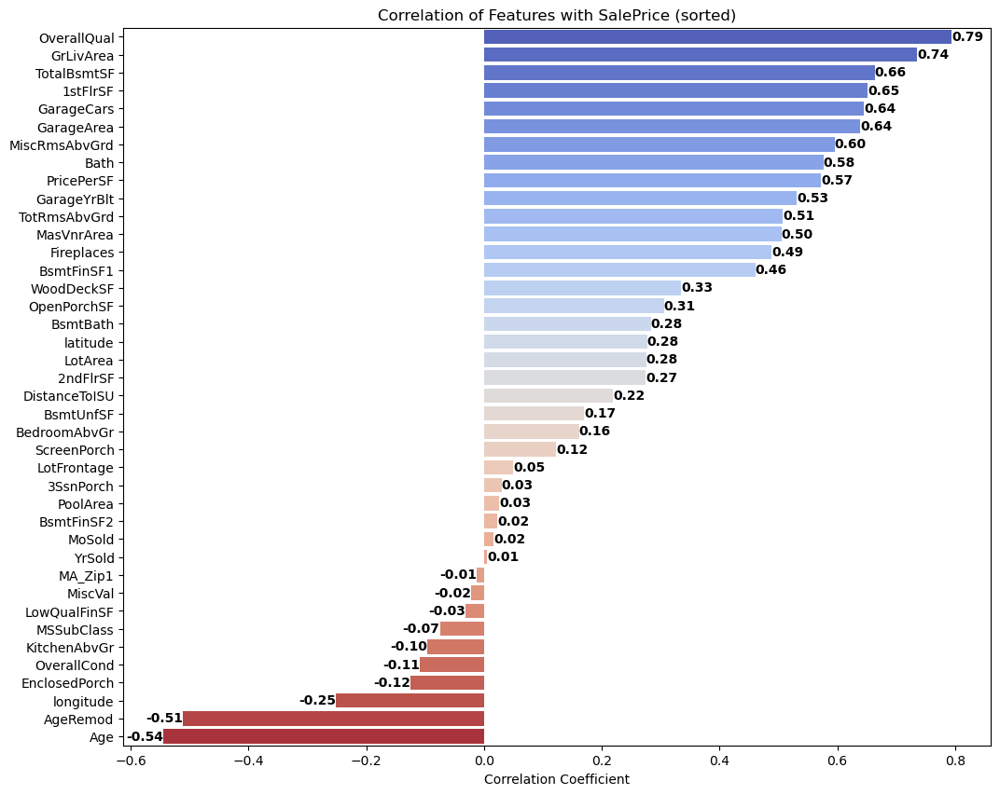

In [30]:
# Get the correlation of all features with 'SalePrice', sort them, and drop 'SalePrice'
# sorted_corrs = abs(housing_coords.corr()['SalePrice']).sort_values(ascending=False).drop(['SalePrice'])
sorted_corrs = (housing_coords.corr()['SalePrice']).sort_values(ascending=False).drop(['SalePrice'])

plt.figure(figsize=(12, 10))
sns.barplot(y=sorted_corrs.index, x=sorted_corrs.values, palette='coolwarm')
for i, value in enumerate(sorted_corrs):
    if value>0:
        plt.text(value, i, f'{value:.2f}', ha='left', va='center', color='black', fontweight='bold')
    else:
        plt.text(value, i, f'{value:.2f}', ha='right', va='center', color='black', fontweight='bold')

plt.title('Correlation of Features with SalePrice (sorted)')
plt.xlabel('Correlation Coefficient')
plt.show()

#abs(housing_coords.corr())['SalePrice'].sort_values(ascending=False)

/var/folders/5v/y3sknb9x0fzg1jwjw5jw77tm0000gn/T/ipykernel_66571/3942188577.py:8: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(housing_coords.drop(columns=['SalePrice']).corr(), cmap=cmap, annot=True, fmt=".1f",


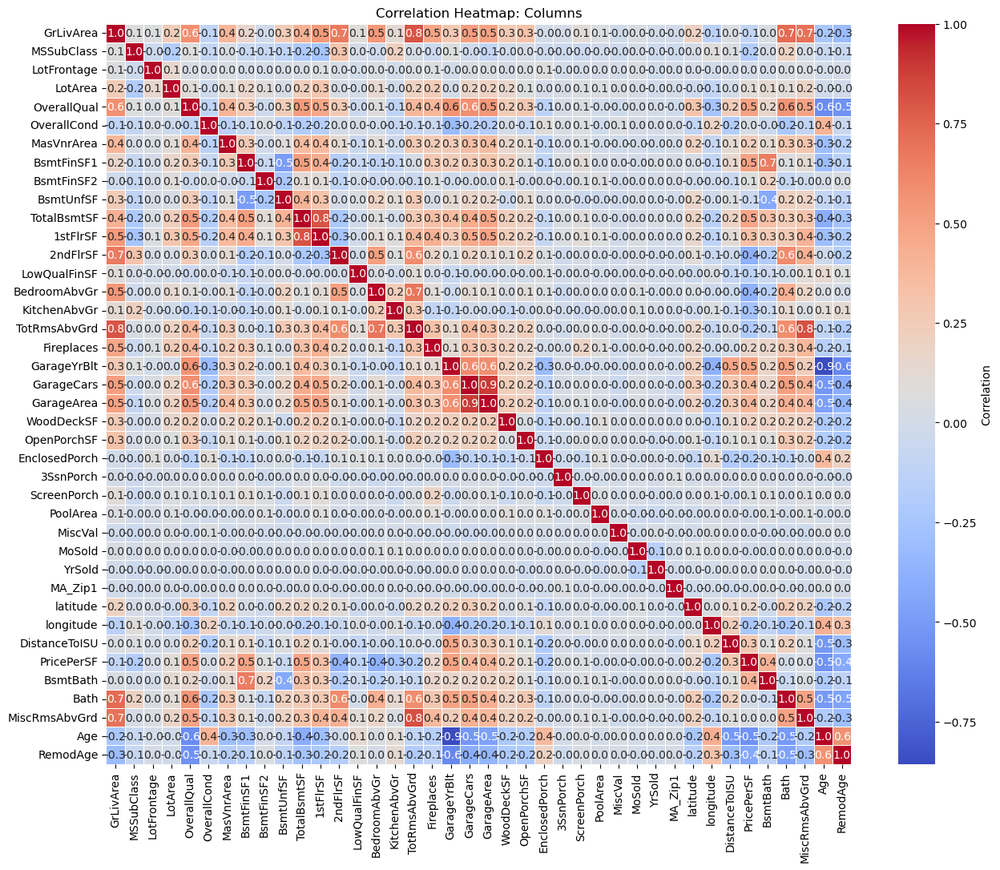

/var/folders/5v/y3sknb9x0fzg1jwjw5jw77tm0000gn/T/ipykernel_66571/3942188577.py:15: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sorted_columns = housing_coords.corr()['SalePrice'].abs().sort_values(ascending=False).index
/var/folders/5v/y3sknb9x0fzg1jwjw5jw77tm0000gn/T/ipykernel_66571/3942188577.py:16: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sorted_corr_matrix = housing_coords.corr()[sorted_columns].abs().loc[sorted_columns]


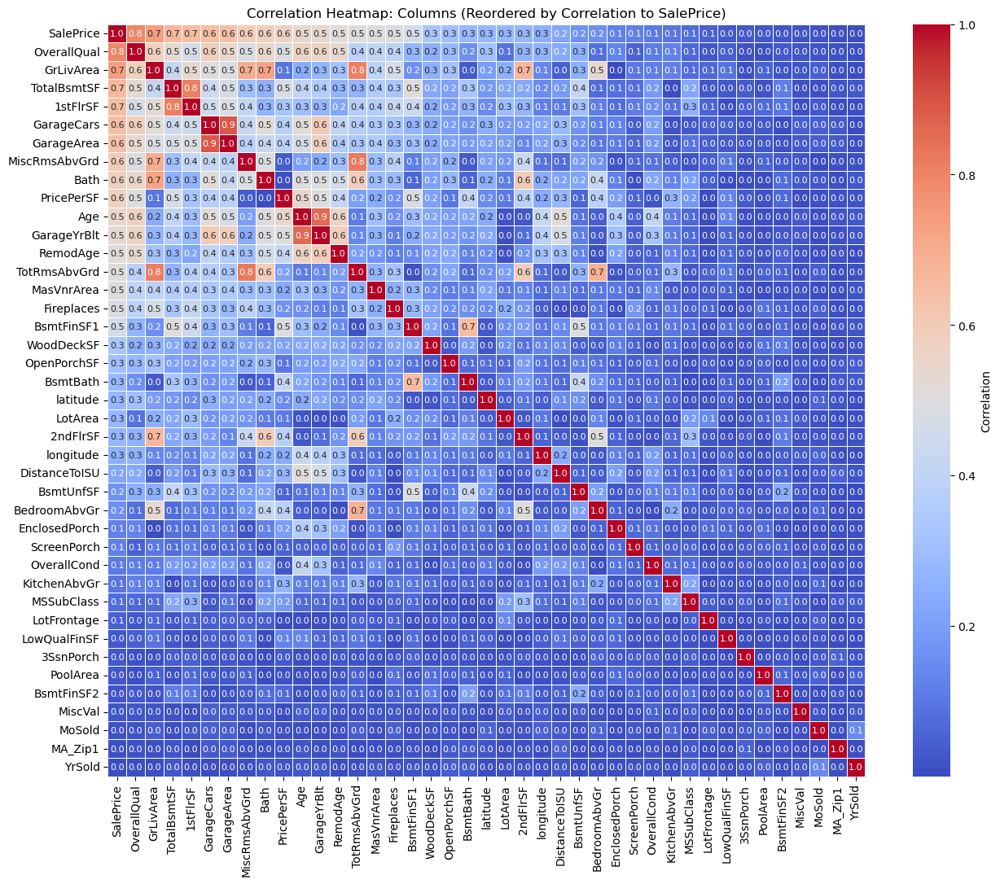

In [72]:
# Choose a larger figure size
plt.figure(figsize=(15, 12))

# Adjust the palette as needed
cmap = sns.color_palette("coolwarm", as_cmap=True)

# Create a heatmap using Seaborn with the masked values
sns.heatmap(housing_coords.drop(columns=['SalePrice']).corr(), cmap=cmap, annot=True, fmt=".1f", 
                      linewidths=0.5, cbar_kws={'label': 'Correlation'})
plt.title('Correlation Heatmap: Columns')
plt.show()


# Reorder columns based on absolute correlation to 'SalePrice'
sorted_columns = housing_coords.corr()['SalePrice'].abs().sort_values(ascending=False).index
sorted_corr_matrix = housing_coords.corr()[sorted_columns].abs().loc[sorted_columns]

plt.figure(figsize=(15, 12))
plt.title('Correlation Heatmap: Columns (Reordered by Correlation to SalePrice)')
cmap = sns.color_palette("coolwarm", as_cmap=True)
sns.heatmap(sorted_corr_matrix, cmap=cmap, annot=True, fmt=".1f", 
            linewidths=0.5, cbar_kws={'label': 'Correlation'},annot_kws={'fontsize': 8})
plt.show()

# Year/Month Trends

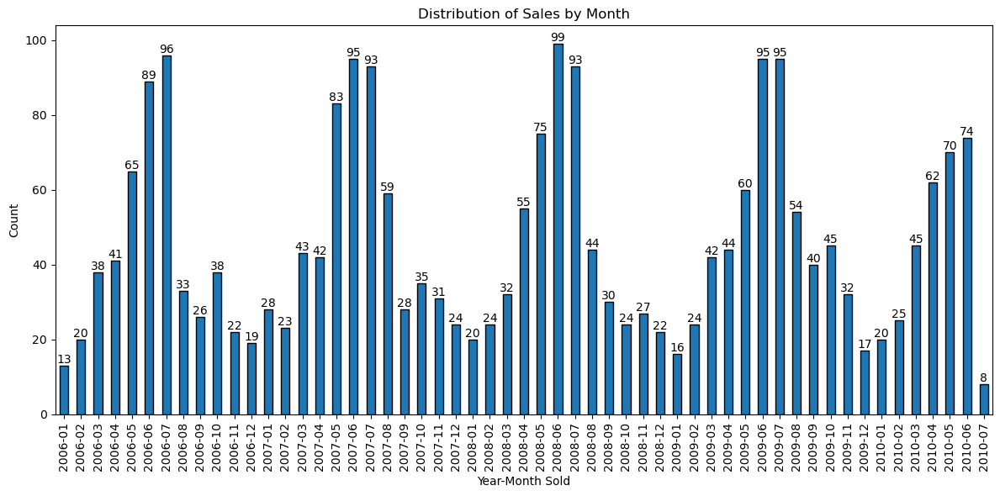

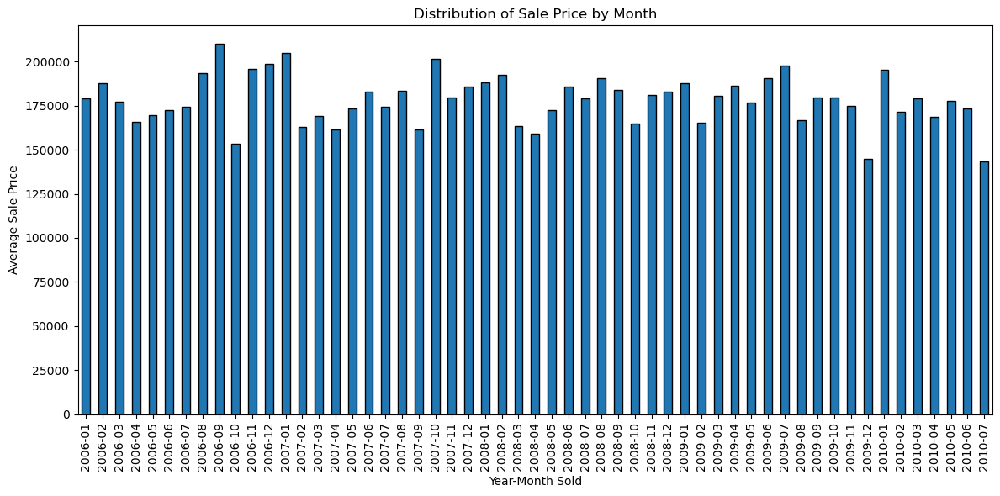

In [47]:
# Create a new column 'YearMonth' by combining 'Year' and 'Month'
plot_df=housing_coords.copy()
plot_df['MoSold'] = plot_df['MoSold'].astype(str).str.zfill(2)
plot_df['YrMoSold'] = plot_df['YrSold'].astype(str) + '-' + plot_df['MoSold'].str.zfill(2)

# Count the occurrences of each Year-Month
sales_by_year_month = plot_df['YrMoSold'].value_counts().sort_index()

# Plot the bar chart
plt.figure(figsize=(12, 6))
sales_by_year_month.plot(kind='bar', edgecolor='black')

# Add count labels on each bar
for i, count in enumerate(sales_by_year_month):
    plt.text(i, count, str(count), ha='center', va='bottom')

plt.title('Distribution of Sales by Month')
plt.xlabel('Year-Month Sold')
plt.ylabel('Count')

# Adjust x-axis ticks for even spacing between bars
plt.xticks(range(len(sales_by_year_month)), sales_by_year_month.index, rotation=90)
plt.tight_layout()
plt.show()



# Count the sale prices of each Year-Month
prices_by_year_month = round(plot_df.groupby('YrMoSold')['SalePrice'].mean()).astype(int)

# Plot the bar chart
plt.figure(figsize=(12, 6))
prices_by_year_month.plot(kind='bar', edgecolor='black')

# # Add count labels on each bar
# for i, count in enumerate(prices_by_year_month):
#     plt.text(i, count, str(count), ha='center', va='bottom')

plt.title('Distribution of Sale Price by Month')
plt.xlabel('Year-Month Sold')
plt.ylabel('Average Sale Price')

# Adjust x-axis ticks for even spacing between bars
plt.xticks(range(len(prices_by_year_month)), prices_by_year_month.index, rotation=90)
plt.tight_layout()
plt.show()

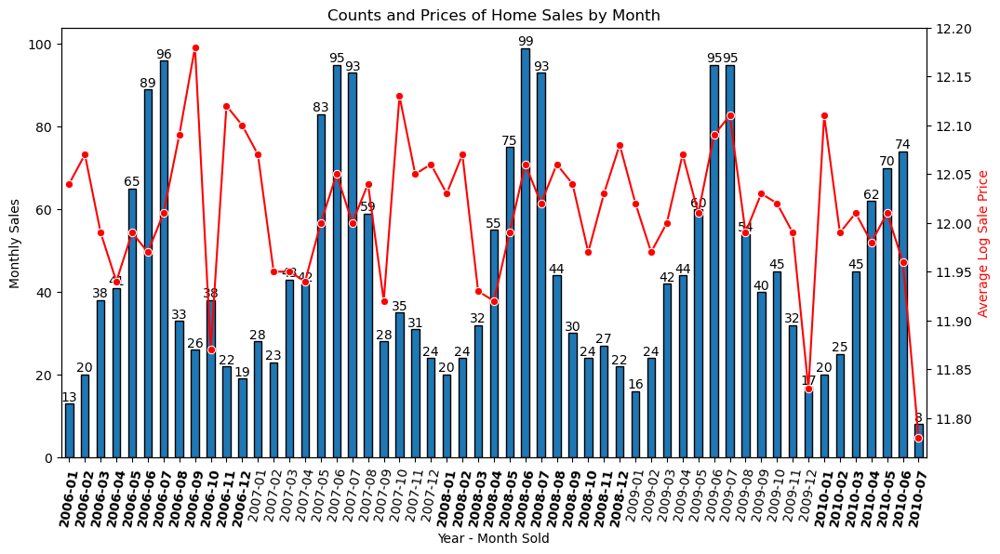

In [74]:
# Create a new column 'YearMonth' by combining 'Year' and 'Month'
plot_df = housing_coords.copy()
plot_df['YrMoSold'] = plot_df['YrSold'].astype(str) + '-' + \
    plot_df['MoSold'].astype(str).str.zfill(2)

# Count the occurrences of each Year-Month
sales_by_year_month = plot_df['YrMoSold'].value_counts().sort_index()

# Calculate the log values for SalePrice
plot_df['LogSalePrice'] = np.log1p(plot_df['SalePrice'])

# Calculate the sale prices of each Year-Month
prices_by_year_month = round(plot_df.groupby('YrMoSold')['LogSalePrice'].mean(), 2)

# Create a figure with two subplots
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot the bar chart with count labels
bar_plot = sales_by_year_month.plot(kind='bar', edgecolor='black')
for i, count in enumerate(sales_by_year_month):
    bar_plot.text(i, count, str(count), ha='center', va='bottom')

# Create a second y-axis for the line chart
ax2 = ax1.twinx()

# Plot the line chart with log values for SalePrice
line_plot = sns.lineplot(x=prices_by_year_month.index, y=prices_by_year_month.values,
                         color='red', marker='o', ax=ax2)

# Set labels and title for the plots
ax1.set_xlabel('Year - Month Sold')
ax1.set_ylabel('Monthly Sales')
ax1.set_title('Counts and Prices of Home Sales by Month')

ax2.set_ylabel('Average Log Sale Price', color='red')
# ax2.set_ylim(0, 1.1 * prices_by_year_month.max())

# Bold every 12th x-axis label
for i, tick in enumerate(ax1.get_xticklabels()):
    if (i // 12) % 2 == 0:
        tick.set_fontweight('bold')

# Adjust rotation of x-axis tick labels
ax1.tick_params(axis='x', rotation=80)

plt.show()


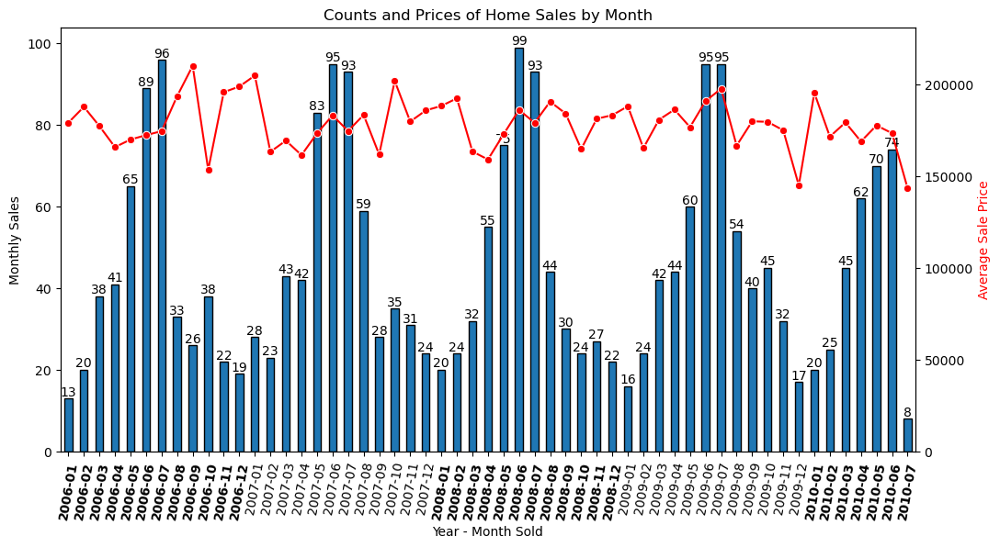

In [68]:
# Create a new column 'YearMonth' by combining 'Year' and 'Month'
plot_df = housing_coords.copy()
plot_df['YrMoSold'] = plot_df['YrSold'].astype(str) + '-' + \
    plot_df['MoSold'].astype(str).str.zfill(2)

sales_by_year_month = plot_df['YrMoSold'].value_counts().sort_index()
prices_by_year_month = round(plot_df.groupby('YrMoSold')['SalePrice'].mean()).astype(int)

fig, ax1 = plt.subplots(figsize=(12, 6))
bar_plot = sales_by_year_month.plot(kind='bar', edgecolor='black')
for i, count in enumerate(sales_by_year_month):
    bar_plot.text(i, count, str(count), ha='center', va='bottom')

ax2 = ax1.twinx()
line_plot = sns.lineplot(x=prices_by_year_month.index, y=prices_by_year_month.values,
                         color='red', marker='o', ax=ax2)

ax1.set_xlabel('Year - Month Sold')
ax1.set_ylabel('Monthly Sales')
ax1.set_title('Counts and Prices of Home Sales by Month')
ax2.set_ylabel('Average Sale Price', color='red')
ax2.set_ylim(0, 1.1 * prices_by_year_month.max())

for i, tick in enumerate(ax1.get_xticklabels()):
    if (i // 12) % 2 == 0:
        tick.set_fontweight('bold')
ax1.tick_params(axis='x', rotation=80)


plt.show()

# Year Built vs Remodeled

In [78]:
housing_coords[['Age','AgeRemod']]

,Age,AgeRemod
0,71,60
1,25,25
2,77,0
3,109,6
4,8,8
...,...,...
2492,93,59
2493,54,54
2494,58,57
2495,7,7


In [145]:
housing_coords.groupby('Age')['AgeRemod'].value_counts()

Age  AgeRemod
0    0           38
1    1           92
     0           36
2    2           44
     1           38
                 ..
128  20           1
129  2            1
     6            1
135  14           1
136  21           1
Name: AgeRemod, Length: 697, dtype: int64

In [144]:
housing_coords['AgeRemod'].value_counts()

1     170
4     104
2      99
3      89
0      86
     ... 
18     15
25     13
22     12
21     10
24     10
Name: AgeRemod, Length: 61, dtype: int64

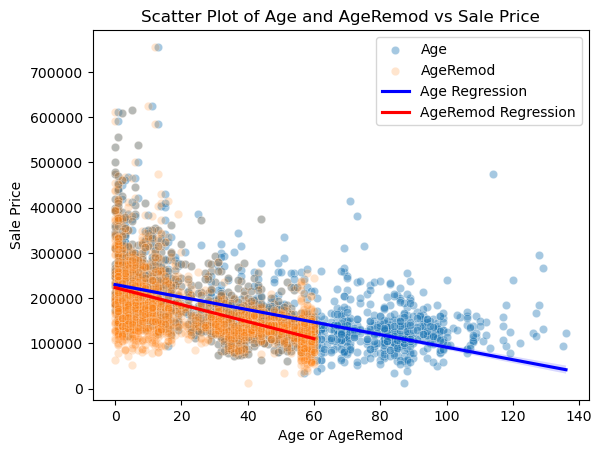

In [152]:
# Scatter plot of Age vs SalePrice
sns.scatterplot(x='Age', y='SalePrice', data=housing_coords, label='Age',alpha=0.4)

# Scatter plot of AgeRemod vs SalePrice
sns.scatterplot(x='AgeRemod', y='SalePrice', data=housing_coords, label='AgeRemod',alpha=0.2)

# Add regression lines
sns.regplot(x='Age', y='SalePrice', data=housing_coords, scatter=False, label='Age Regression', color='blue')
sns.regplot(x='AgeRemod', y='SalePrice', data=housing_coords, scatter=False, label='AgeRemod Regression', color='red')

# Set labels and title
plt.xlabel('Age or AgeRemod')
plt.ylabel('Sale Price')
plt.title('Scatter Plot of Age and AgeRemod vs Sale Price')

# Add legend
plt.legend()

# Show the plot
plt.show()

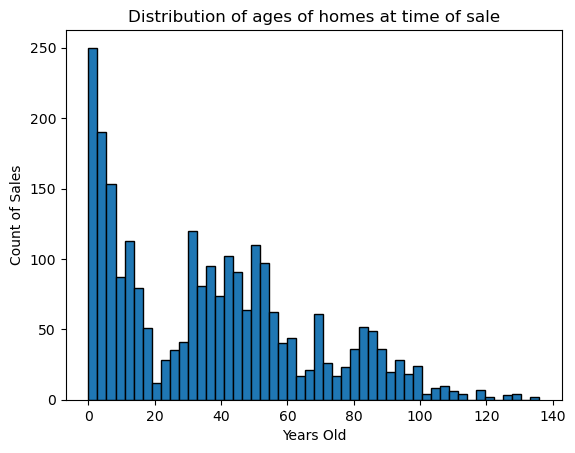

In [157]:
plt.hist(housing_coords['Age'], bins=50, edgecolor='black')
plt.title('Distribution of ages of homes at time of sale')
plt.xlabel('Years Old')
plt.ylabel('Count of Sales')
plt.show()

# ADD REGRESSION LINE TO THESE:

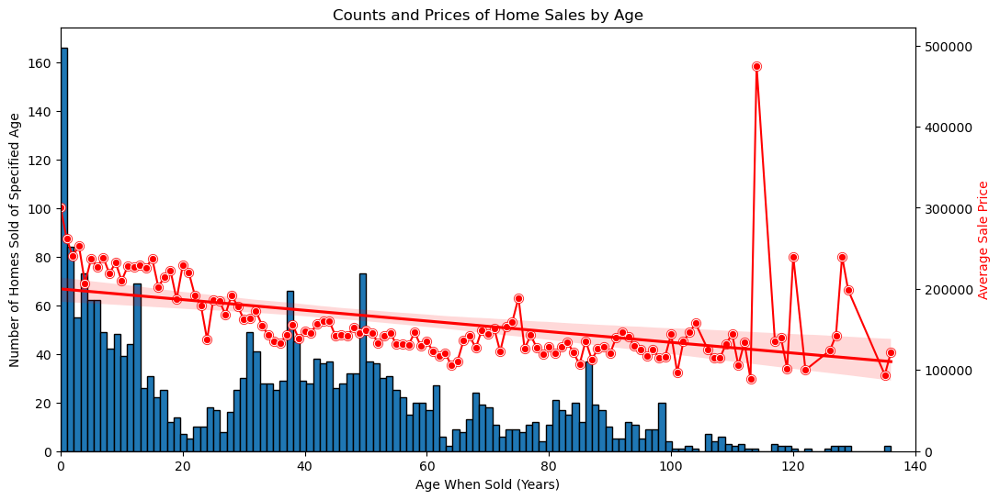

In [190]:
plot_df = housing_coords.copy()

sales_by_age = plot_df['Age'].value_counts()
prices_by_age = round(plot_df.groupby('Age')['SalePrice'].mean()).astype(int)


bins=len(sales_by_age)
fig, ax1 = plt.subplots(figsize=(12, 6))
# bar_plot = sales_by_year_month.plot(kind='bar', edgecolor='black')
bar_plot = plt.hist(plot_df['Age'], bins=bins, edgecolor='black')

ax2 = ax1.twinx()
line_plot = sns.lineplot(x=prices_by_age.index, y=prices_by_age.values,
                         color='red', marker='o', ax=ax2)

sns.regplot(x=prices_by_age.index, y=prices_by_age.values,
            scatter_kws={'s': 50}, color='red', ax=ax2, label='Regression Line')

ax1.set_xlabel('Age When Sold (Years)')
ax1.set_ylabel('Number of Homes Sold of Specified Age')
ax1.set_title('Counts and Prices of Home Sales by Age')
ax2.set_ylabel('Average Sale Price', color='red')
ax2.set_ylim(0, 1.1 * prices_by_age.max())
ax1.set_xlim(0, 140)
ax1.tick_params(axis='x', rotation=0)

plt.show()

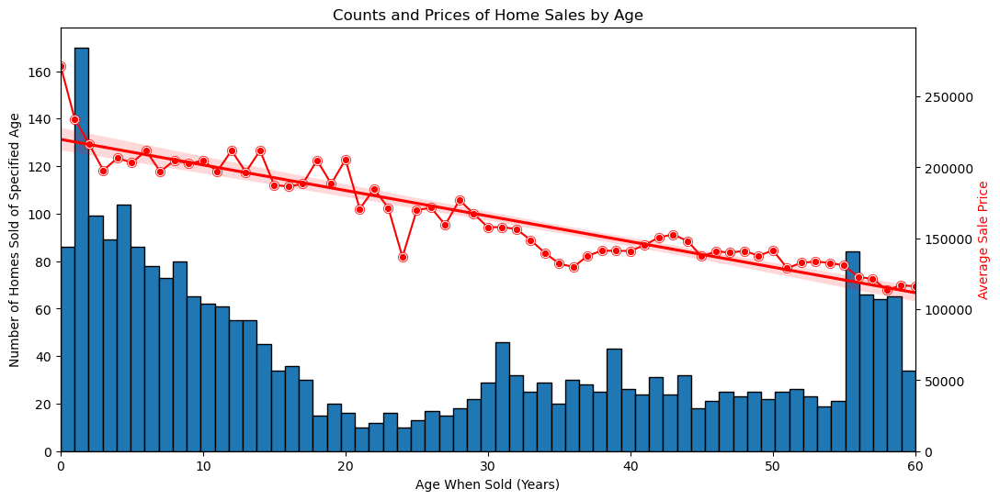

In [194]:
plot_df = housing_coords.copy()

sales_by_age_remod = plot_df['AgeRemod'].value_counts()
prices_by_age_remod = round(plot_df.groupby('AgeRemod')['SalePrice'].mean()).astype(int)


bins=len(sales_by_age_remod)
fig, ax1 = plt.subplots(figsize=(12, 6))
# bar_plot = sales_by_year_month.plot(kind='bar', edgecolor='black')
bar_plot = plt.hist(plot_df['AgeRemod'], bins=bins, edgecolor='black')

ax2 = ax1.twinx()
line_plot = sns.lineplot(x=prices_by_age_remod.index, y=prices_by_age_remod.values,
                         color='red', marker='o', ax=ax2)

sns.regplot(x=prices_by_age_remod.index, y=prices_by_age_remod.values,
            scatter_kws={'s': 50}, color='red', ax=ax2, label='Regression Line')

ax1.set_xlabel('Age When Sold (Years)')
ax1.set_ylabel('Number of Homes Sold of Specified Age')
ax1.set_title('Counts and Prices of Home Sales by Age')
ax2.set_ylabel('Average Sale Price', color='red')
ax2.set_ylim(0, 1.1 * prices_by_age_remod.max())
ax1.set_xlim(0, 60)
ax1.tick_params(axis='x', rotation=0)

plt.show()

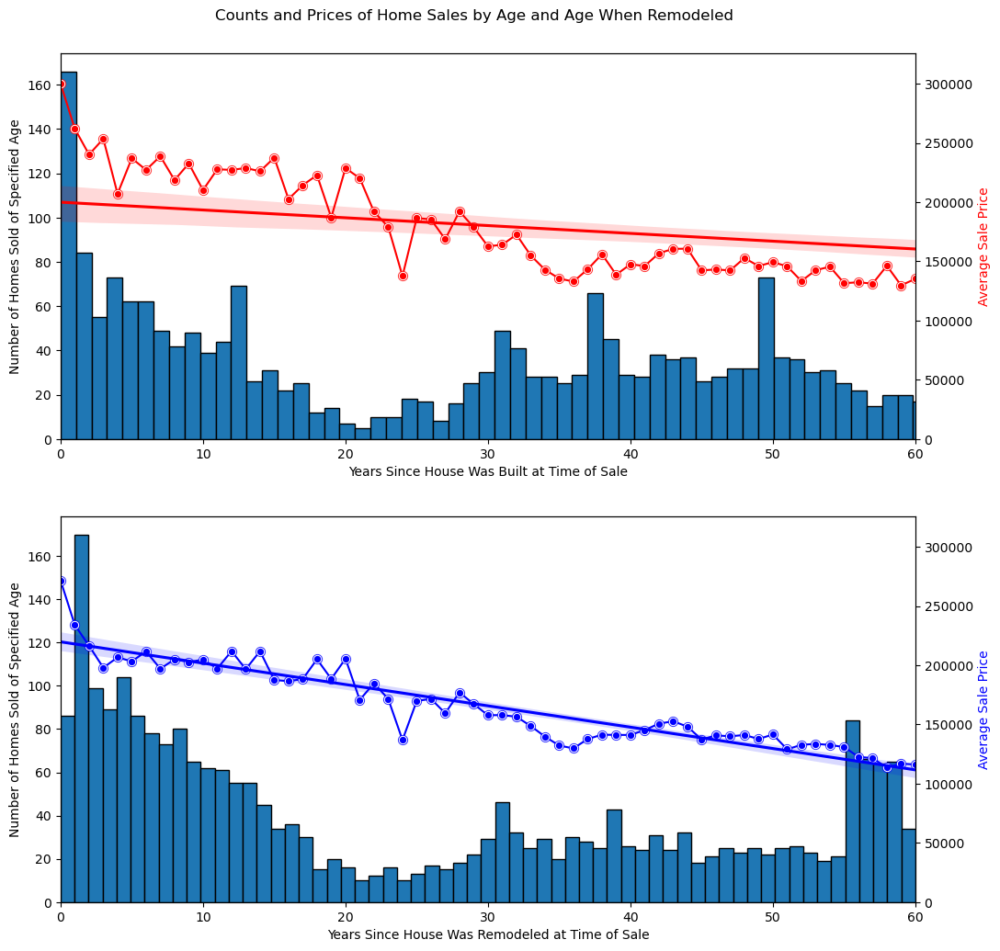

In [227]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot 1
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 12))

sales_by_age = plot_df['Age'].value_counts()
prices_by_age = round(plot_df.groupby('Age')['SalePrice'].mean()).astype(int)

bins = len(sales_by_age)
bar_plot1 = ax1.hist(plot_df['Age'], bins=bins, edgecolor='black')

ax3 = ax1.twinx()
line_plot1 = sns.lineplot(x=prices_by_age.index, y=prices_by_age.values,
                          color='red', marker='o', ax=ax3)

sns.regplot(x=prices_by_age.index, y=prices_by_age.values,
            scatter_kws={'s': 50}, color='red', ax=ax3, label='Regression Line')

ax1.set_xlabel('Years Since House Was Built at Time of Sale')
ax1.set_ylabel('Number of Homes Sold of Specified Age')
ax3.set_ylabel('Average Sale Price', color='red')
ax3.set_ylim(0, 1.2 * prices_by_age_remod.max())
ax1.set_xlim(0, 60)
ax1.tick_params(axis='x', rotation=0)

# Plot 2
sales_by_age_remod = plot_df['AgeRemod'].value_counts()
prices_by_age_remod = round(plot_df.groupby('AgeRemod')['SalePrice'].mean()).astype(int)

bins = len(sales_by_age_remod)
bar_plot2 = ax2.hist(plot_df['AgeRemod'], bins=bins, edgecolor='black')

ax4 = ax2.twinx()
line_plot2 = sns.lineplot(x=prices_by_age_remod.index, y=prices_by_age_remod.values,
                          color='blue', marker='o', ax=ax4)

sns.regplot(x=prices_by_age_remod.index, y=prices_by_age_remod.values,
            scatter_kws={'s': 50}, color='blue', ax=ax4, label='Regression Line')

ax2.set_xlabel('Years Since House Was Remodeled at Time of Sale')
ax2.set_ylabel('Number of Homes Sold of Specified Age')
ax4.set_ylabel('Average Sale Price', color='blue')
ax4.set_ylim(0, 1.2 * prices_by_age_remod.max())
ax2.set_xlim(0, 60)
ax2.tick_params(axis='x', rotation=0)

# Add a title to the entire figure
plt.suptitle('Counts and Prices of Home Sales by Age and Age When Remodeled', y=0.92)

plt.show()


# Outliers

In [225]:
abs(sorted_corrs).sort_values(ascending=False)

OverallQual      0.794030
GrLivArea        0.735870
TotalBsmtSF      0.663099
1stFlrSF         0.651540
GarageCars       0.644856
GarageArea       0.638634
MiscRmsAbvGrd    0.595104
Bath             0.576539
PricePerSF       0.572530
Age              0.544842
GarageYrBlt      0.531575
YearRemodAdd     0.509822
TotRmsAbvGrd     0.507776
MasVnrArea       0.504937
Fireplaces       0.488735
BsmtFinSF1       0.460870
WoodDeckSF       0.334867
OpenPorchSF      0.305583
BsmtBath         0.283183
latitude         0.276901
LotArea          0.275300
2ndFlrSF         0.274968
longitude        0.251803
DistanceToISU    0.219580
BsmtUnfSF        0.170000
BedroomAbvGr     0.161496
EnclosedPorch    0.124848
ScreenPorch      0.122067
OverallCond      0.109348
KitchenAbvGr     0.096739
MSSubClass       0.074732
LotFrontage      0.050140
LowQualFinSF     0.030963
3SsnPorch        0.030009
PoolArea         0.026005
BsmtFinSF2       0.023027
MiscVal          0.021669
MoSold           0.016086
MA_Zip1     

In [220]:
['OverallQual','GrLivArea','TotalBsmtSF','1stFlrSF','GarageCars','GarageArea','MiscRmsAbvGr']

0       1
1       2
2       2
3       3
4       2
       ..
2492    1
2493    3
2494    2
2495    3
2496    4
Name: MiscRmsAbvGrd, Length: 2497, dtype: int64

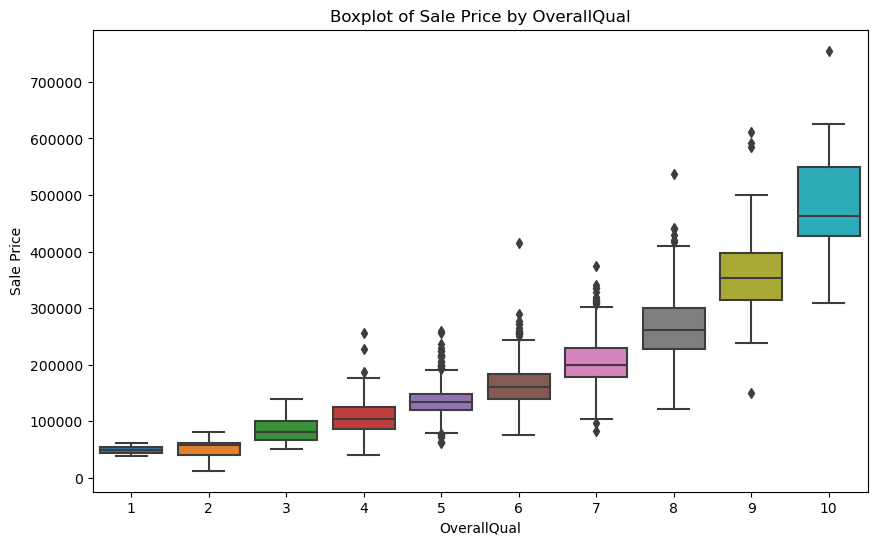

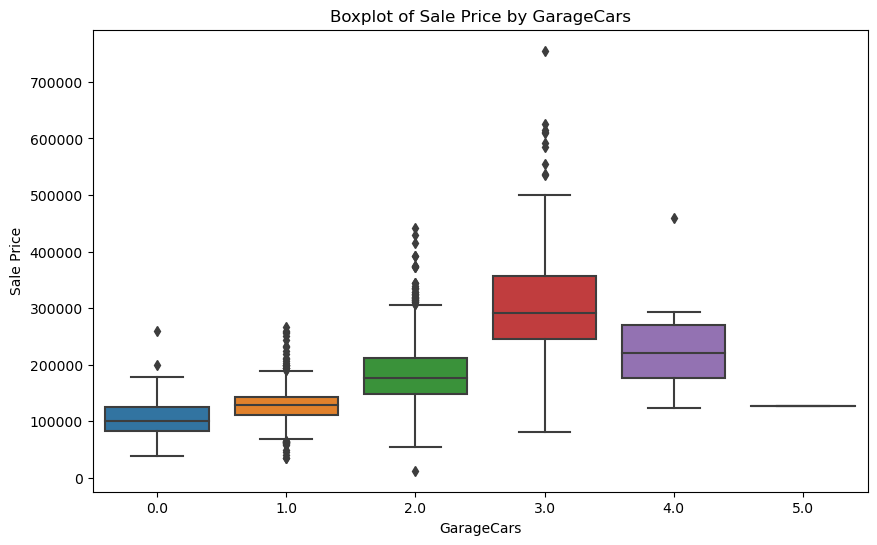

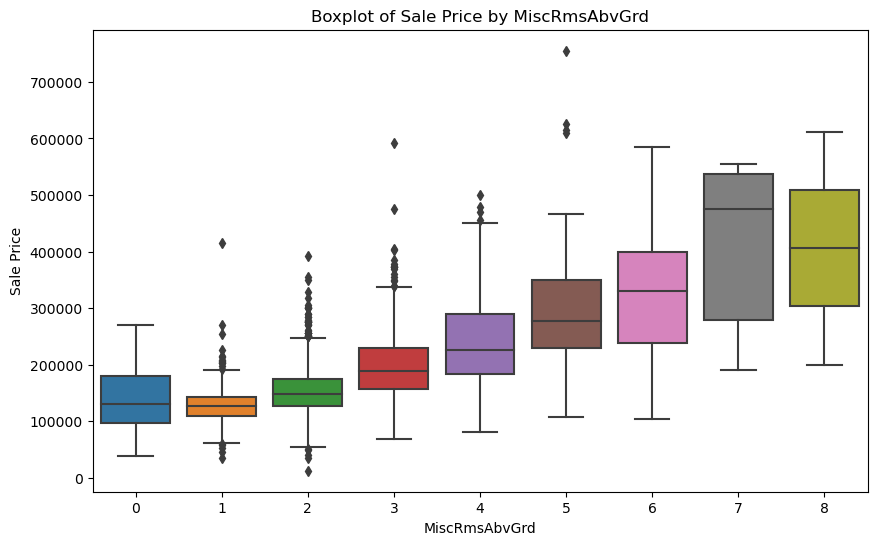

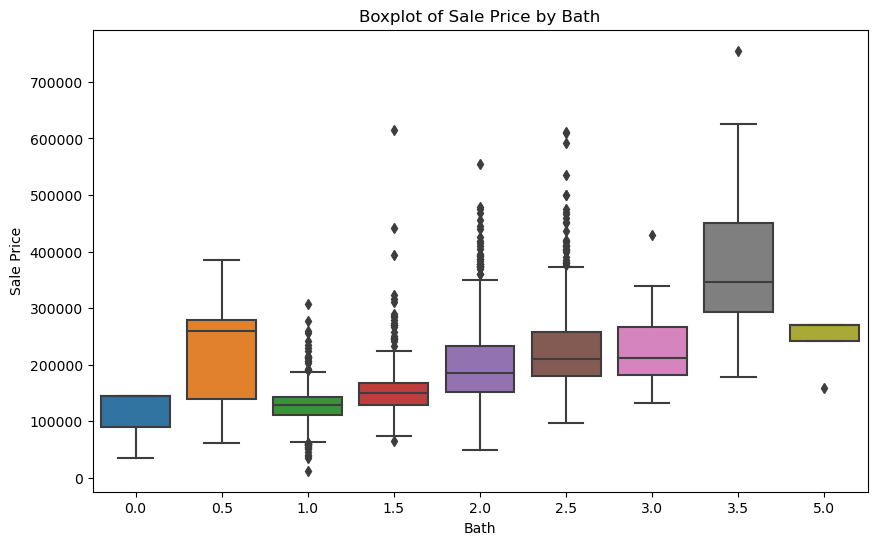

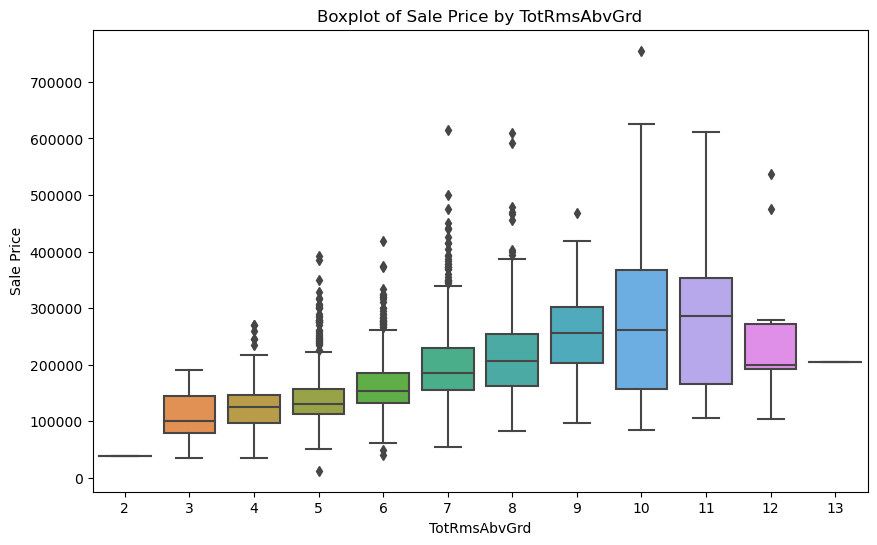

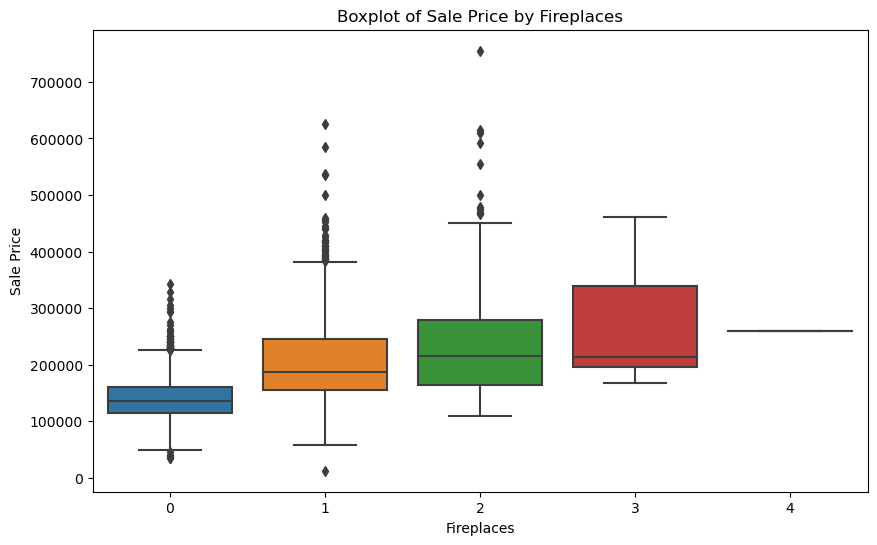

In [226]:
for topcorr in ['OverallQual','GarageCars','MiscRmsAbvGrd','Bath','TotRmsAbvGrd','Fireplaces']:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=topcorr, y='SalePrice', data=housing_coords)
    plt.xlabel(topcorr)
    plt.ylabel('Sale Price')
    plt.title(f'Boxplot of Sale Price by {topcorr}')
    plt.show()

/var/folders/5v/y3sknb9x0fzg1jwjw5jw77tm0000gn/T/ipykernel_66571/2659983756.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_data = housing_coords.groupby('FireplaceQu').mean()['SalePrice']


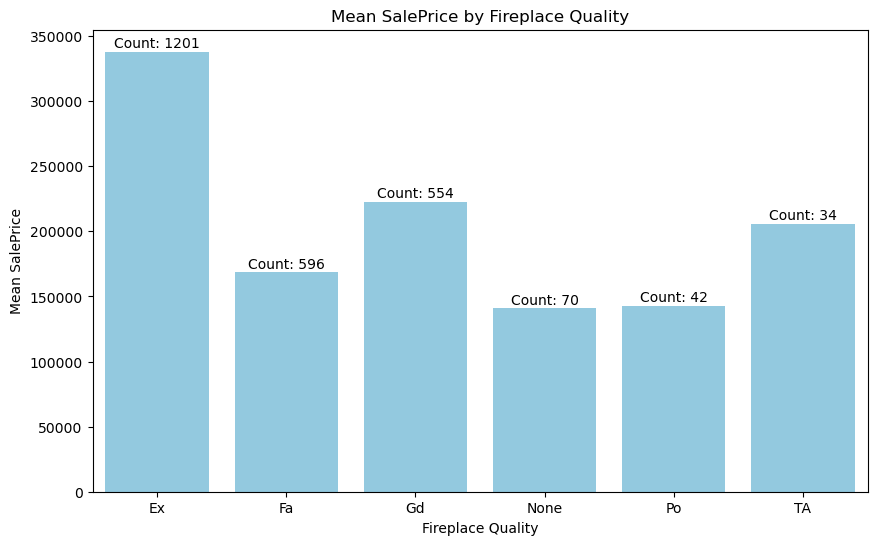

In [229]:
grouped_data = housing_coords.groupby('FireplaceQu').mean()['SalePrice']
value_counts = housing_coords['FireplaceQu'].value_counts()

plt.figure(figsize=(10, 6))
bar_plot = sns.barplot(x=grouped_data.index, y=grouped_data.values, color='skyblue')
for i, count in enumerate(value_counts):
    bar_plot.text(i, grouped_data.values[i] + 1000, f'Count: {count}', 
                  ha='center', va='bottom', rotation=0, color='black')
plt.title('Mean SalePrice by Fireplace Quality')
plt.xlabel('Fireplace Quality')
plt.ylabel('Mean SalePrice')
plt.show()


# Distance to ISU

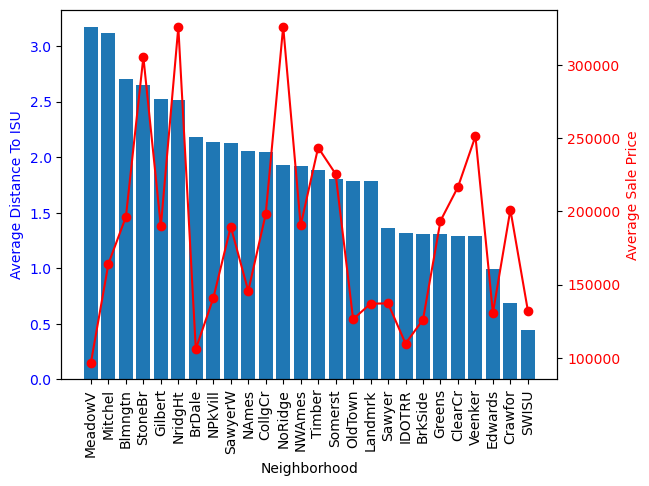

In [238]:
neighborhood_df = housing_coords.groupby('Neighborhood').agg(
    {'DistanceToISU': 'mean', 'SalePrice': 'mean'}).reset_index()

neighborhood_df = neighborhood_df.sort_values(by='DistanceToISU', ascending=False)

# Set up the figure and axes
fig, ax1 = plt.subplots()

# Plot Count on the left y-axis
ax1.bar(neighborhood_df['Neighborhood'], neighborhood_df['DistanceToISU'])
ax1.set_ylabel('Average Distance To ISU', color='blue')
ax1.set_xlabel('Neighborhood')
ax1.tick_params(axis='y', labelcolor='blue')

# Create a second y-axis for DistanceToISU
ax2 = ax1.twinx()
ax2.plot(neighborhood_df['Neighborhood'], neighborhood_df['SalePrice'], color='red', marker='o')
ax2.set_ylabel('Average Sale Price', color='red')
ax2.tick_params(axis='y', labelcolor='red')

# Rotate x-axis labels by 90 degrees
ax1.tick_params(axis='x', rotation=90)

# Show the plot
plt.show()

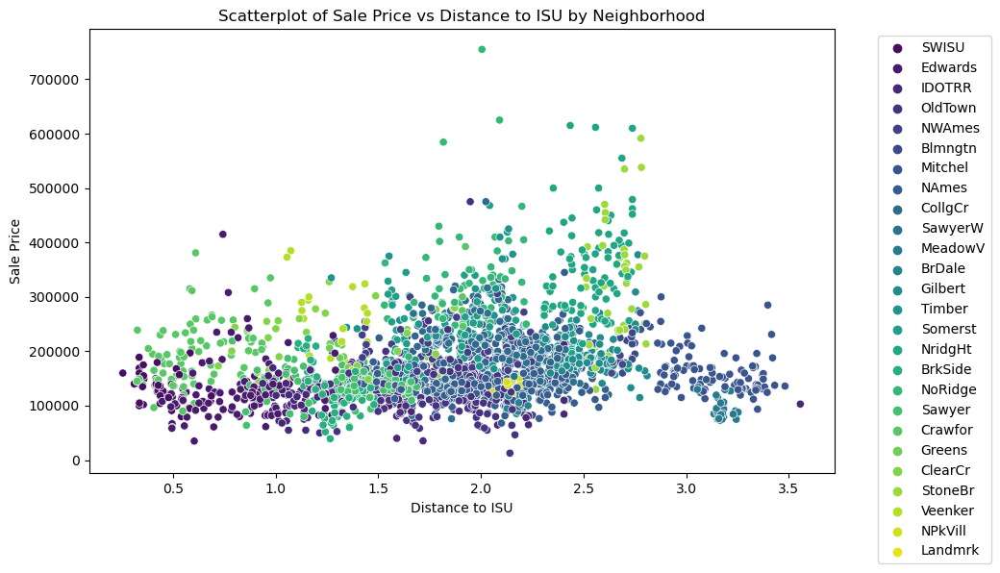

In [244]:
plt.figure(figsize=(10, 6))
scatter_plot = sns.scatterplot(x='DistanceToISU', y='SalePrice', hue='Neighborhood', data=housing_coords, palette='viridis')

plt.xlabel('Distance to ISU')
plt.ylabel('Sale Price')
plt.title('Scatterplot of Sale Price vs Distance to ISU by Neighborhood')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

In [275]:
housing_coords.groupby(pd.cut(housing_coords['DistanceToISU'], bins=8))['SalePrice'].mean()

DistanceToISU
(0.251, 0.668]    150655.264463
(0.668, 1.08]     152482.160000
(1.08, 1.493]     147357.255385
(1.493, 1.906]    170590.928177
(1.906, 2.318]    184779.061089
(2.318, 2.731]    221435.252404
(2.731, 3.144]    214854.573034
(3.144, 3.557]    127058.533333
Name: SalePrice, dtype: float64

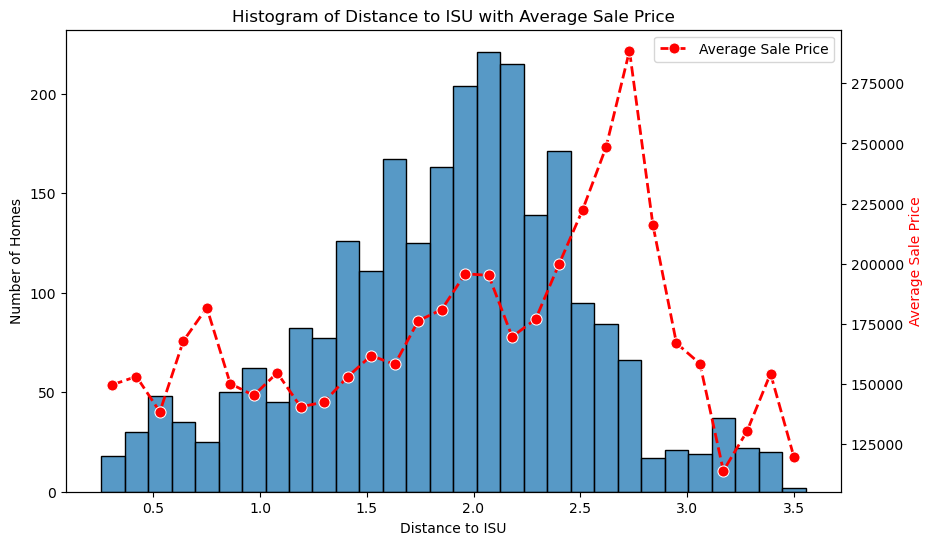

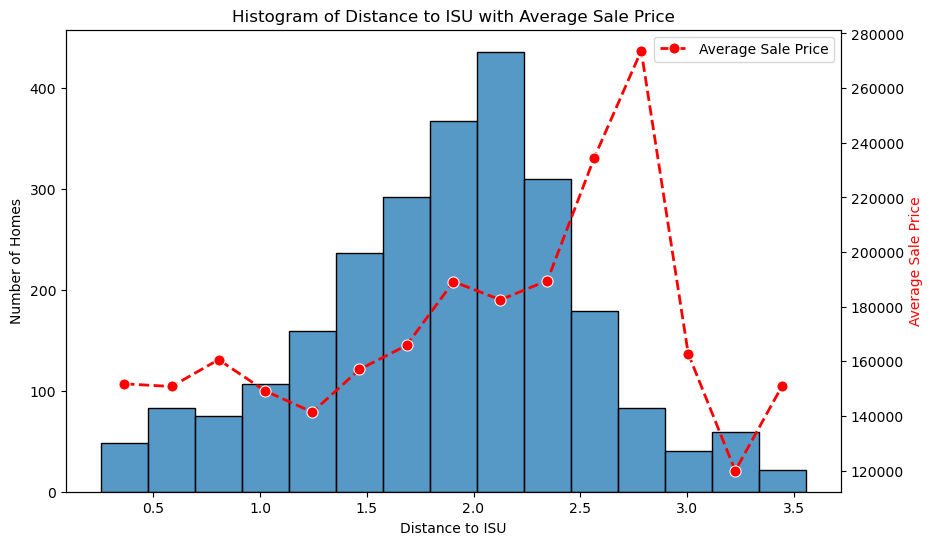

In [285]:
fig, ax1 = plt.subplots(figsize=(10, 6))
bins = 30

# Plot the histogram
histogram_plot = sns.histplot(x='DistanceToISU', data=housing_coords, bins=bins, edgecolor='black', kde=False, ax=ax1)

# Calculate average 'SalePrice' for each bin
average_price = housing_coords.groupby(pd.cut(housing_coords['DistanceToISU'], bins=bins))['SalePrice'].mean()

# Overlay the average 'SalePrice' as a line plot
ax2 = ax1.twinx()
line_plot = sns.lineplot(x=average_price.index.categories.mid.to_numpy(), y=average_price.values, color='red', marker='o', linestyle='dashed', linewidth=2, markersize=8, ax=ax2, label='Average Sale Price')

# Customize labels and title
ax1.set_xlabel('Distance to ISU')
ax1.set_ylabel('Number of Homes')
ax2.set_ylabel('Average Sale Price', color='red')
plt.title('Histogram of Distance to ISU with Average Sale Price')

# Show the plot
plt.show()

fig, ax1 = plt.subplots(figsize=(10, 6))
bins = 15

# Plot the histogram
histogram_plot = sns.histplot(x='DistanceToISU', data=housing_coords, bins=bins, edgecolor='black', kde=False, ax=ax1)

# Calculate average 'SalePrice' for each bin
average_price = housing_coords.groupby(pd.cut(housing_coords['DistanceToISU'], bins=bins))['SalePrice'].mean()

# Overlay the average 'SalePrice' as a line plot
ax2 = ax1.twinx()
line_plot = sns.lineplot(x=average_price.index.categories.mid.to_numpy(), y=average_price.values, color='red', marker='o', linestyle='dashed', linewidth=2, markersize=8, ax=ax2, label='Average Sale Price')

# Customize labels and title
ax1.set_xlabel('Distance to ISU')
ax1.set_ylabel('Number of Homes')
ax2.set_ylabel('Average Sale Price', color='red')
plt.title('Histogram of Distance to ISU with Average Sale Price')

# Show the plot
plt.show()

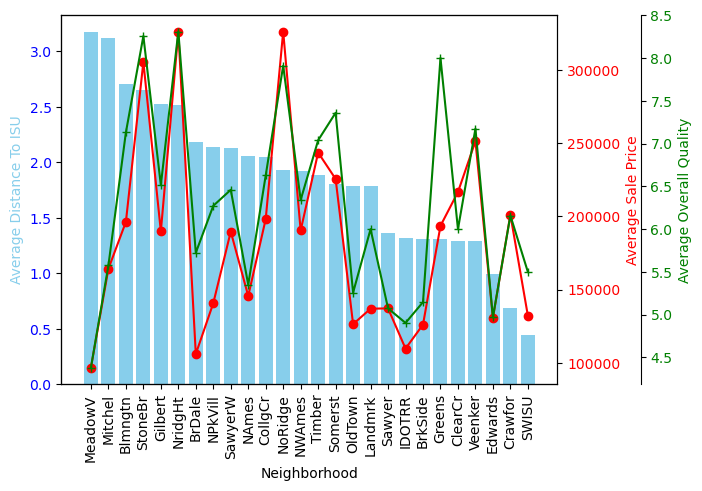

In [299]:
neighborhood_df = housing_coords.groupby('Neighborhood').agg(
    {'DistanceToISU': 'mean', 'SalePrice': 'mean', 'OverallQual':'mean'}).reset_index()

neighborhood_df = neighborhood_df.sort_values(by='DistanceToISU', ascending=False)

# Set up the figure and axes
fig, ax1 = plt.subplots()

# Plot Count on the left y-axis
ax1.bar(neighborhood_df['Neighborhood'], neighborhood_df['DistanceToISU'], color='skyblue')
ax1.set_ylabel('Average Distance To ISU', color='skyblue')
ax1.set_xlabel('Neighborhood')
ax1.tick_params(axis='y', labelcolor='blue')

# Create a second y-axis
ax2 = ax1.twinx()
ax2.plot(neighborhood_df['Neighborhood'], neighborhood_df['SalePrice'], color='red', marker='o')
ax2.set_ylabel('Average Sale Price', color='red')
ax2.tick_params(axis='y', labelcolor='red')

# Create a third y-axis
ax3 = ax1.twinx()
ax3.spines['right'].set_position(('outward', 60))
ax3.plot(neighborhood_df['Neighborhood'], neighborhood_df['OverallQual'], color='green', marker='+')
ax3.set_ylabel('Average Overall Quality', color='green')
ax3.tick_params(axis='y', labelcolor='green')

# Rotate x-axis labels by 90 degrees
ax1.tick_params(axis='x', rotation=90)

# Show the plot
plt.show()

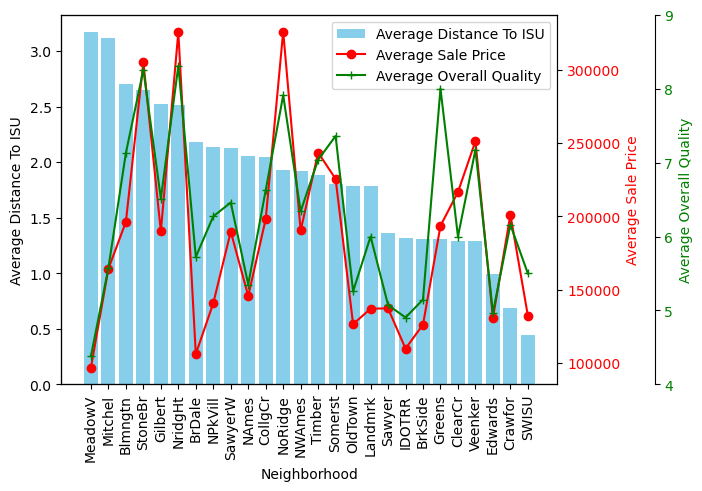

In [306]:
neighborhood_df = housing_coords.groupby('Neighborhood').agg(
    {'DistanceToISU': 'mean', 'SalePrice': 'mean', 'OverallQual':'mean'}).reset_index()
neighborhood_df = neighborhood_df.sort_values(by='DistanceToISU', ascending=False)

fig, ax1 = plt.subplots()
plot1 = ax1.bar(neighborhood_df['Neighborhood'], neighborhood_df['DistanceToISU'], 
                color='skyblue', label='Average Distance To ISU')
ax1.set_ylabel('Average Distance To ISU')
ax1.set_xlabel('Neighborhood')
ax1.tick_params(axis='y')

# Create a second y-axis
ax2 = ax1.twinx()
plot2 = ax2.plot(neighborhood_df['Neighborhood'], neighborhood_df['SalePrice'], 
                 color='red', marker='o', label='Average Sale Price')
ax2.set_ylabel('Average Sale Price', color='red')
ax2.tick_params(axis='y', labelcolor='red')

# Create a third y-axis
ax3 = ax1.twinx()

# Adjust the position of the third y-axis to the right
ax3.spines['right'].set_position(('outward', 70))

plot3 = ax3.plot(neighborhood_df['Neighborhood'], neighborhood_df['OverallQual'], 
                 color='green', marker='+', label='Average Overall Quality')
ax3.set_ylabel('Average Overall Quality', color='green')
ax3.tick_params(axis='y', labelcolor='green')
ax3.set_ylim(4, 9)

# Rotate x-axis labels by 90 degrees
ax1.tick_params(axis='x', rotation=90)

# Add legends for each plot
plots = [plot1, plot2[0], plot3[0]]
labels = [p.get_label() for p in plots]
ax1.legend(plots, labels, loc='upper right')

# Show the plot
plt.show()


In [341]:
def compare_price_qual(categorical_column,legend_loc='upper right'):
    plot_df = housing_coords.groupby('Neighborhood').agg(
        {categorical_column: 'mean', 'SalePrice': 'mean', 'OverallQual':'mean'}).reset_index()
    plot_df = plot_df.sort_values(by=categorical_column, ascending=False)

    fig, ax1 = plt.subplots()
    plot1 = ax1.bar(plot_df['Neighborhood'], plot_df[categorical_column], 
                    color='skyblue', label=f'Average {categorical_column}')
    ax1.set_ylabel(f'Average {categorical_column}')
    ax1.set_xlabel('Neighborhood')
    ax1.tick_params(axis='y')

    # Create a second y-axis
    ax2 = ax1.twinx()
    plot2 = ax2.plot(plot_df['Neighborhood'], plot_df['SalePrice'], 
                     color='red', marker='o', label='Average Sale Price')
    ax2.set_ylabel('Average Sale Price', color='red')
    ax2.tick_params(axis='y', labelcolor='red')

    # Create a third y-axis
    ax3 = ax1.twinx()

    # Adjust the position of the third y-axis to the right
    ax3.spines['right'].set_position(('outward', 70))

    plot3 = ax3.plot(plot_df['Neighborhood'], plot_df['OverallQual'], 
                     color='green', marker='+', label='Average Overall Quality')
    ax3.set_ylabel('Average Overall Quality', color='green')
    ax3.tick_params(axis='y', labelcolor='green')
    ax3.set_ylim(4, 9)

    # Rotate x-axis labels by 90 degrees
    ax1.tick_params(axis='x', rotation=90)

    # Add legends for each plot
    plots = [plot1, plot2[0], plot3[0]]
    labels = [p.get_label() for p in plots]
    ax1.legend(plots, labels, loc=legend_loc)

    # Show the plot
    plt.show()


In [316]:
abs(sorted_corrs).sort_values(ascending=False).index

Index(['OverallQual', 'GrLivArea', 'TotalBsmtSF', '1stFlrSF', 'GarageCars',
       'GarageArea', 'MiscRmsAbvGrd', 'Bath', 'PricePerSF', 'Age',
       'GarageYrBlt', 'YearRemodAdd', 'TotRmsAbvGrd', 'MasVnrArea',
       'Fireplaces', 'BsmtFinSF1', 'WoodDeckSF', 'OpenPorchSF', 'BsmtBath',
       'latitude', 'LotArea', '2ndFlrSF', 'longitude', 'DistanceToISU',
       'BsmtUnfSF', 'BedroomAbvGr', 'EnclosedPorch', 'ScreenPorch',
       'OverallCond', 'KitchenAbvGr', 'MSSubClass', 'LotFrontage',
       'LowQualFinSF', '3SsnPorch', 'PoolArea', 'BsmtFinSF2', 'MiscVal',
       'MoSold', 'MA_Zip1', 'YrSold'],
      dtype='object')

In [315]:
housing_coords.columns

Index(['GrLivArea', 'SalePrice', 'MSSubClass', 'MSZoning', 'LotFrontage',
       'LotArea', 'Street', 'LotShape', 'LandContour', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'RoofStyle', 'RoofMatl',
       'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual',
       'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical',
       '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'BedroomAbvGr', 'KitchenAbvGr',
       'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces',
       'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish',
       'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive',
       'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'ScreenPorch', 'PoolArea', 'MiscVal', 

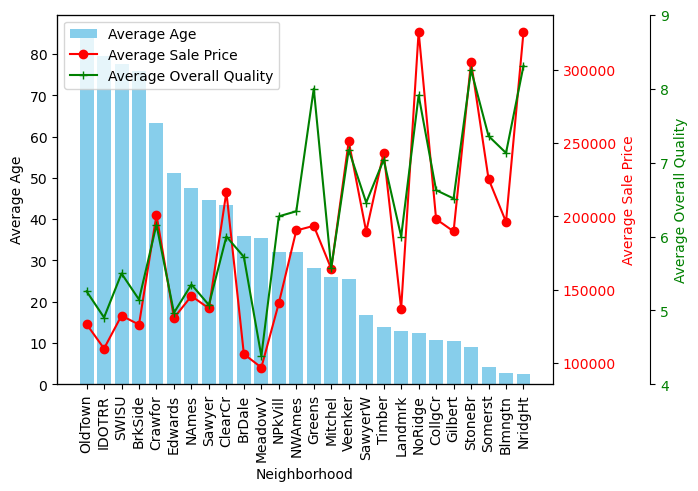

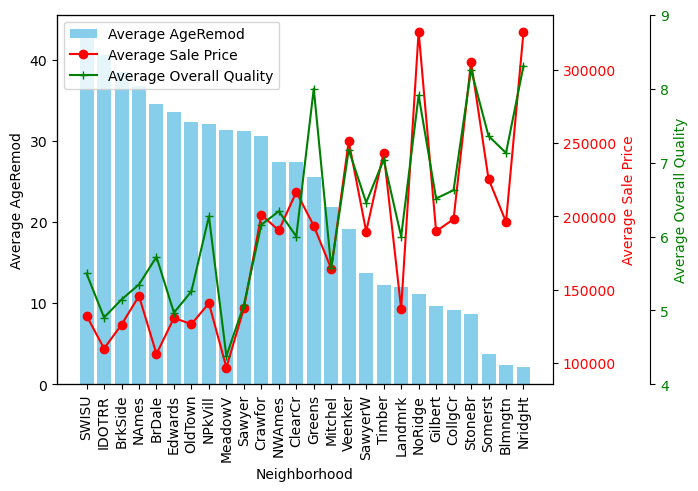

In [343]:
compare_price_qual('Age','upper left')
compare_price_qual('AgeRemod','upper left')

In [340]:
import folium
import random
from IPython.display import display

# Create a folium map centered at the mean of coordinates

map_center = [0.5*(housing_coords['latitude'].max() + housing_coords['latitude'].min()), 
              0.5*(housing_coords['longitude'].max() + housing_coords['longitude'].min())]
mymap = folium.Map(location=map_center, zoom_start=13.25)

# Get unique neighborhoods from the DataFrame
neighborhoods = list(housing_coords['Neighborhood'].unique())

# Define a color dictionary with random colors for each neighborhood
color_dict = {neighborhood: "#{:06x}".format(random.randint(0, 0xFFFFFF)) for neighborhood in neighborhoods}

# Iterate through the DataFrame and add markers to the map
for index, row in housing_coords.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=2,
        color=color_dict.get(row['Neighborhood'], 'gray'),
        fill=True,
        fill_color=color_dict.get(row['Neighborhood'], 'gray'),
#         fill_opacity=0.7,
        popup=row['Neighborhood'],
    ).add_to(mymap)

# Display the map directly in the Jupyter Notebook
display(mymap)

In [347]:
housing_coords.dtypes.value_counts()

object     39
int64      26
float64    15
dtype: int64

# Categorical Variables:

In [362]:
# Identify categorical columns based on your criteria
# For example, you might choose columns with dtype 'object'
categorical_columns = housing_coords.select_dtypes(include='object').columns

# Identify the columns to exclude based on correlation
exclude_columns = abs(sorted_corrs).sort_values(ascending=False).index

# Filter out continuous columns and excluded columns
categorical_columns = [col for col in categorical_columns if col not in exclude_columns] + ['SalePrice']

# Create a DataFrame to store the results
results_df = pd.DataFrame(columns=['Variable1', 'Variable2', 'Chi2', 'P-Value', 'Degrees of Freedom'])

# Perform chi-square test for independence for all pairs of categorical columns
for i in range(len(categorical_columns)):
    for j in range(i + 1, len(categorical_columns)):
        variable1 = categorical_columns[i]
        variable2 = categorical_columns[j]
        contingency_table = pd.crosstab(housing_coords[variable1], housing_coords[variable2])
        chi2, p, dof, expected = chi2_contingency(contingency_table)
        
        # Concatenate results to the DataFrame
        results_df = pd.concat([results_df, pd.DataFrame({
            'Variable1': [variable1],
            'Variable2': [variable2],
            'Chi2': [chi2],
            'P-Value': [p],
            'Degrees of Freedom': [dof]
        })], ignore_index=True)

# # Display the results DataFrame
# print(results_df)

In [363]:
results_df.sort_values(by='Chi2', ascending=False)

,Variable1,Variable2,Chi2,P-Value,Degrees of Freedom
779,Prop_Addr,SalePrice,2.119953e+06,3.399254e-01,2119104
250,Neighborhood,Prop_Addr,6.242500e+04,4.710443e-01,62400
478,Exterior2nd,Prop_Addr,3.745500e+04,4.771750e-01,37440
453,Exterior1st,Prop_Addr,3.495800e+04,4.778812e-01,34944
251,Neighborhood,SalePrice,2.417434e+04,4.802846e-43,21225
...,...,...,...,...,...
299,Condition2,Heating,3.185325e-01,1.000000e+00,30
287,Condition2,RoofMatl,2.836354e-01,1.000000e+00,36
61,Street,Heating,1.358555e-01,9.996552e-01,5
49,Street,RoofMatl,1.209717e-01,9.999648e-01,6


In [365]:
results_df.loc[results_df['P-Value']<.05].sort_values(by='Chi2', ascending=False).head(10)
# results_df.loc[results_df['Degrees of Freedom']<250].sort_values(by='Chi2', ascending=False)


,Variable1,Variable2,Chi2,P-Value,Degrees of Freedom
251,Neighborhood,SalePrice,24174.338450,4.802846e-43,21225
429,Exterior1st,Exterior2nd,21548.138994,0.000000e+00,210
454,Exterior1st,SalePrice,12941.253905,1.408319e-11,11886
314,Condition2,SalePrice,10152.546907,0.000000e+00,5094
776,SaleType,SalePrice,8995.303743,1.644138e-25,7641
589,BsmtQual,SalePrice,6773.909427,6.338433e-121,4245
734,Functional,SalePrice,6172.354692,6.385379e-24,5094
674,Heating,SalePrice,5786.570944,1.571006e-51,4245
751,GarageType,SalePrice,5720.918535,1.117922e-09,5094
608,BsmtCond,SalePrice,5466.351769,2.264152e-34,4245


In [406]:
sorted_columns_categorical = list(results_df.loc[results_df.Variable2=='SalePrice'].loc[results_df['P-Value']<.05].sort_values(by='Chi2', ascending=False)['Variable1'])
sorted_columns_categorical


['Neighborhood',
 'Exterior1st',
 'Condition2',
 'SaleType',
 'BsmtQual',
 'Functional',
 'Heating',
 'GarageType',
 'BsmtCond',
 'SaleCondition',
 'GarageQual',
 'BsmtFinType1',
 'FireplaceQu',
 'Foundation',
 'MSZoning',
 'KitchenQual',
 'ExterQual',
 'BsmtExposure',
 'GarageFinish',
 'Electrical',
 'LotShape',
 'MasVnrType',
 'LandContour',
 'PavedDrive',
 'LandSlope',
 'Street',
 'CentralAir']

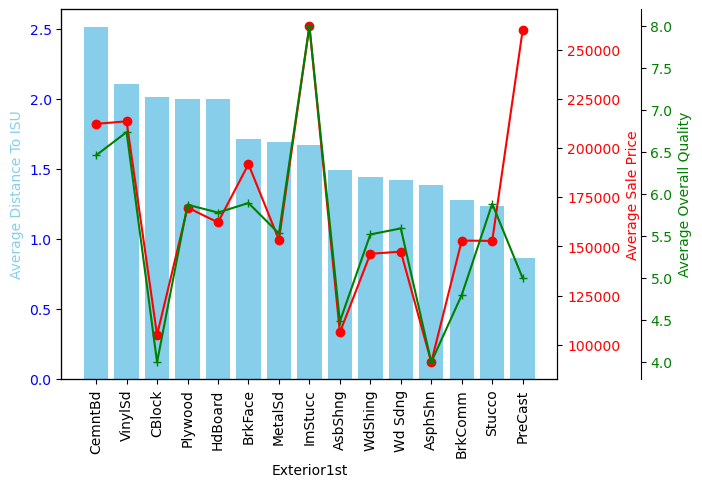

In [368]:
neighborhood_df = housing_coords.groupby('Exterior1st').agg(
    {'DistanceToISU': 'mean', 'SalePrice': 'mean', 'OverallQual':'mean'}).reset_index()

neighborhood_df = neighborhood_df.sort_values(by='DistanceToISU', ascending=False)

# Set up the figure and axes
fig, ax1 = plt.subplots()

# Plot Count on the left y-axis
ax1.bar(neighborhood_df['Exterior1st'], neighborhood_df['DistanceToISU'], color='skyblue')
ax1.set_ylabel('Average Distance To ISU', color='skyblue')
ax1.set_xlabel('Exterior1st')
ax1.tick_params(axis='y', labelcolor='blue')

# Create a second y-axis
ax2 = ax1.twinx()
ax2.plot(neighborhood_df['Exterior1st'], neighborhood_df['SalePrice'], color='red', marker='o')
ax2.set_ylabel('Average Sale Price', color='red')
ax2.tick_params(axis='y', labelcolor='red')

# Create a third y-axis
ax3 = ax1.twinx()
ax3.spines['right'].set_position(('outward', 60))
ax3.plot(neighborhood_df['Exterior1st'], neighborhood_df['OverallQual'], color='green', marker='+')
ax3.set_ylabel('Average Overall Quality', color='green')
ax3.tick_params(axis='y', labelcolor='green')

# Rotate x-axis labels by 90 degrees
ax1.tick_params(axis='x', rotation=90)

# Show the plot
plt.show()

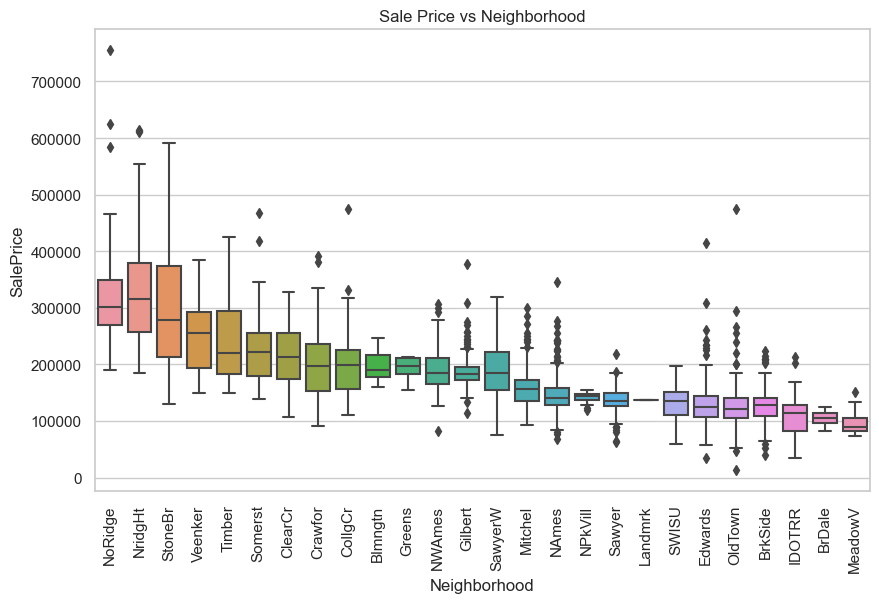

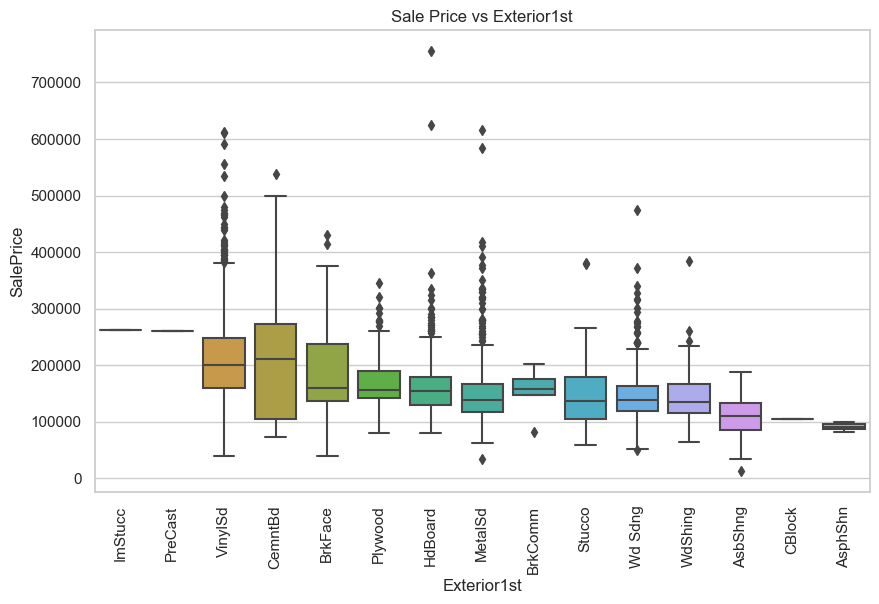

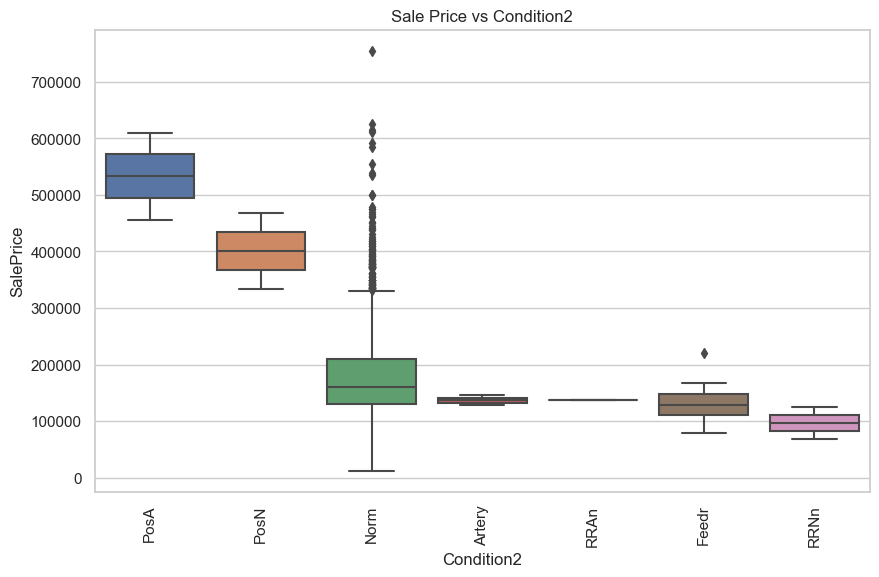

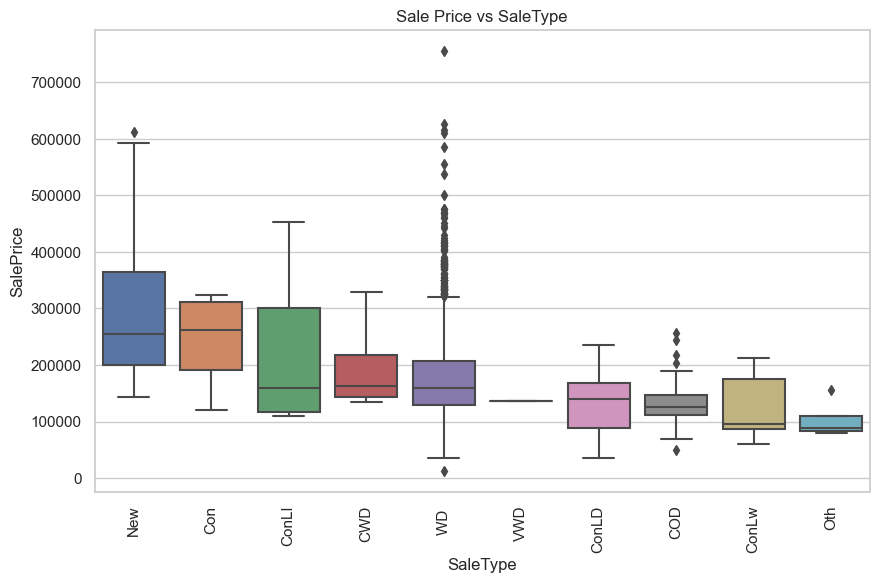

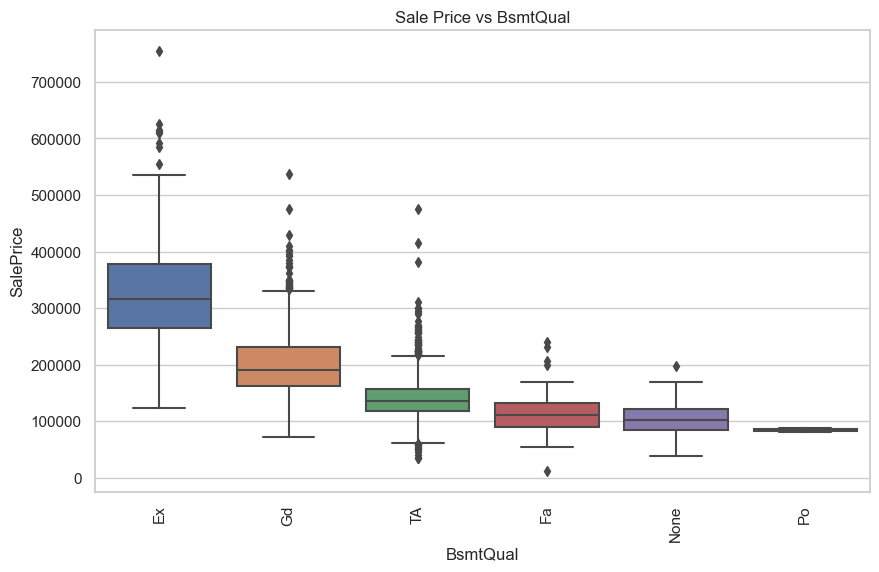

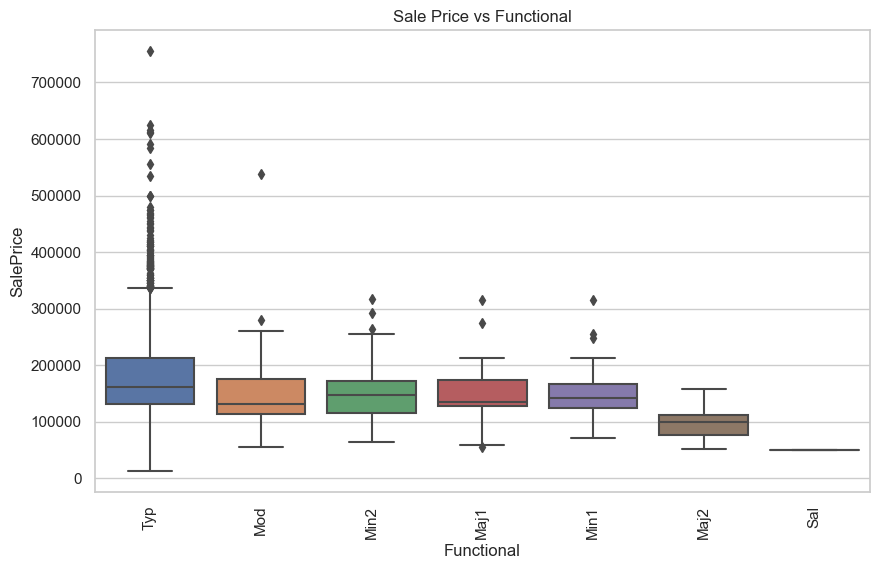

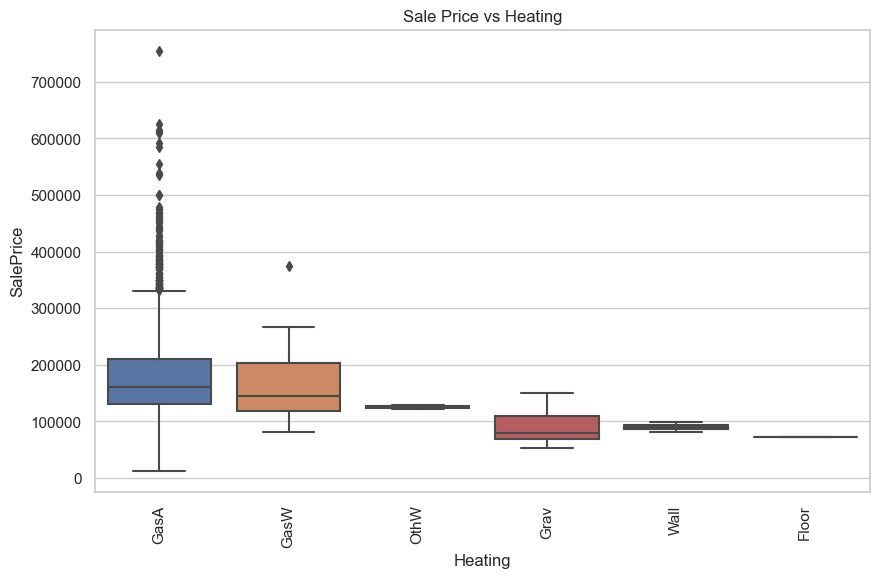

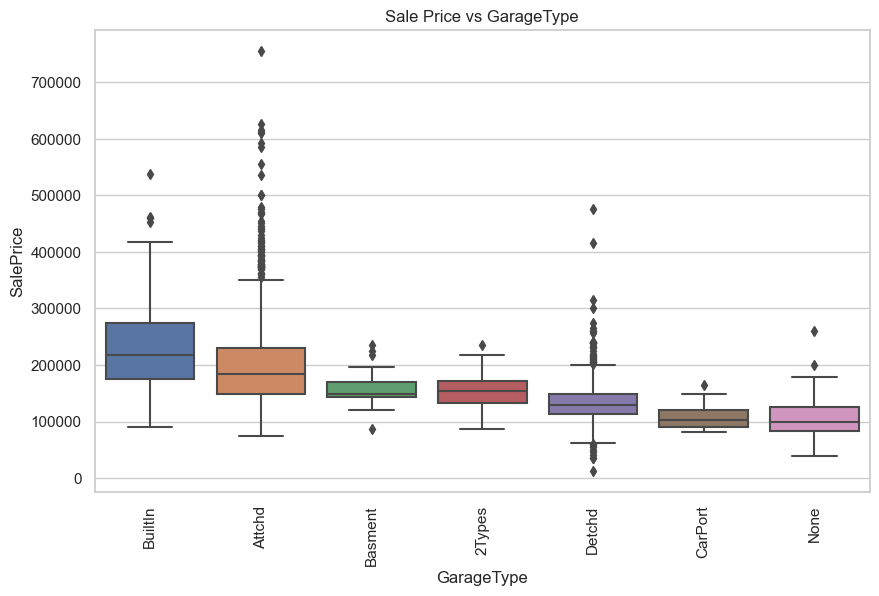

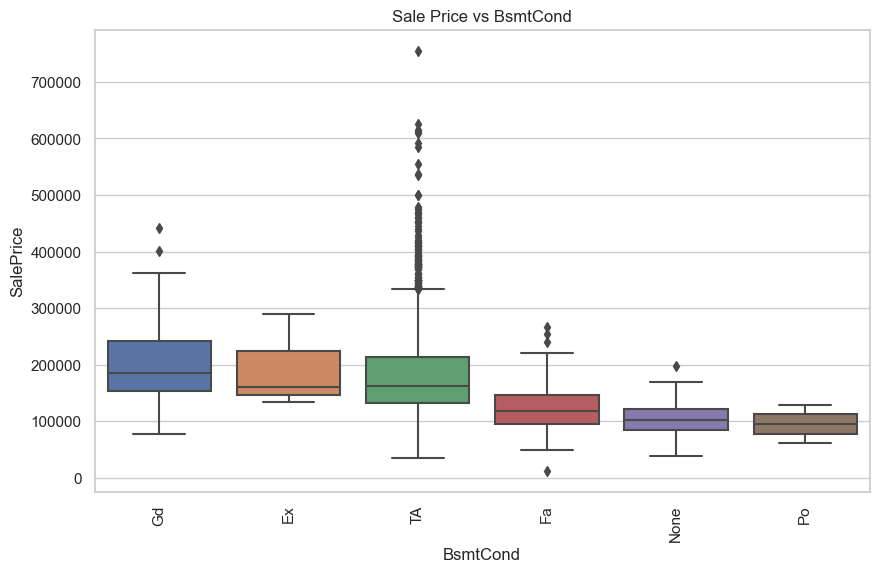

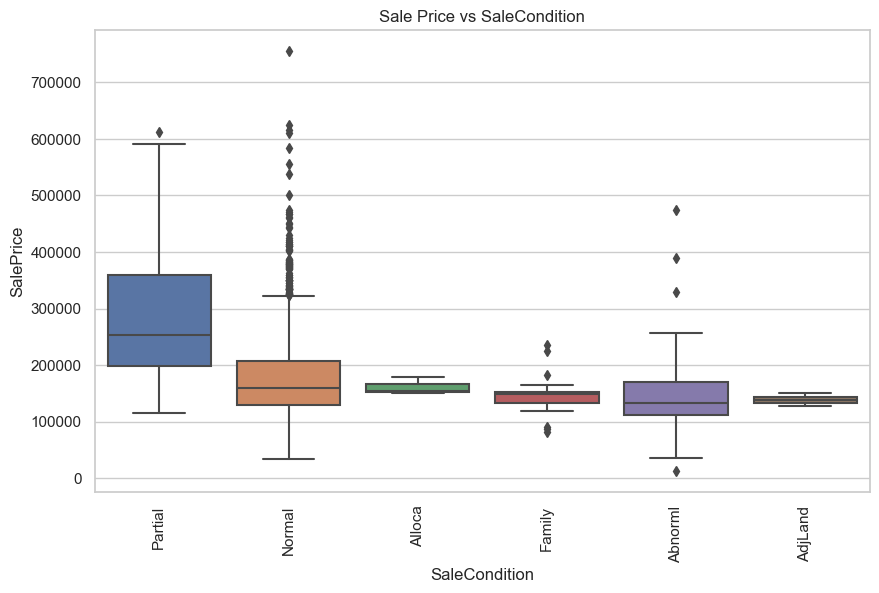

In [380]:
for cat_col in sorted_columns_categorical[:10]:
    mean_prices = housing_coords.groupby(cat_col)['SalePrice'].mean().sort_values(ascending=False)
    plt.figure(figsize=(10, 6))
    sns.set(style="whitegrid")
    sns.boxplot(x=cat_col, y='SalePrice', data=housing_coords, order=mean_prices.index)
    plt.title(f'Sale Price vs {cat_col}')
    plt.xticks(rotation=90)
    plt.show()

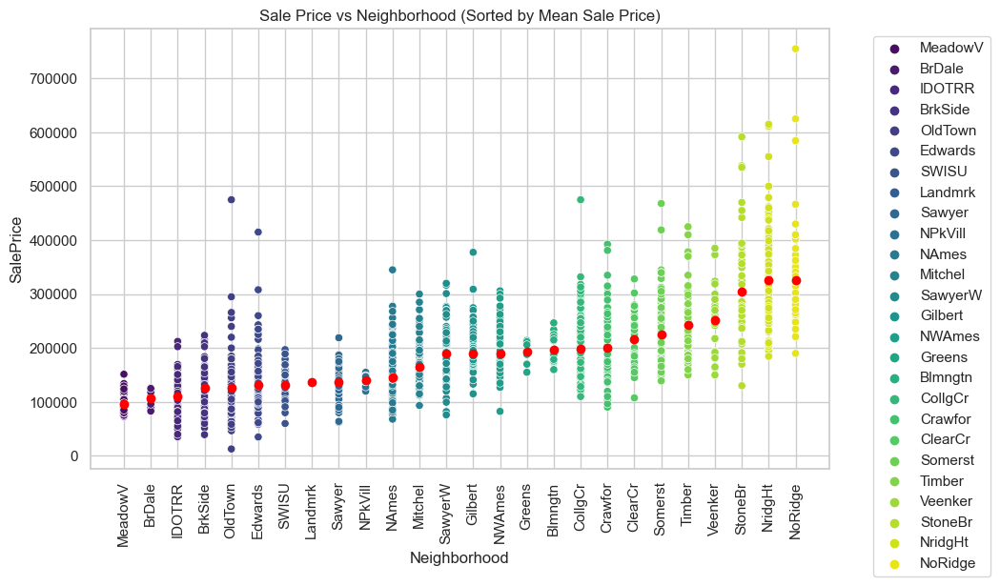

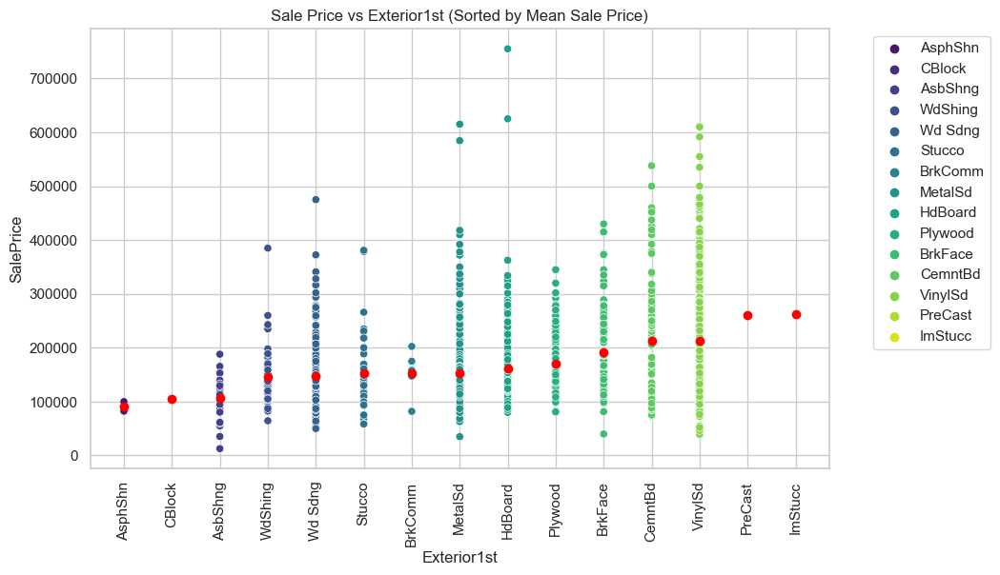

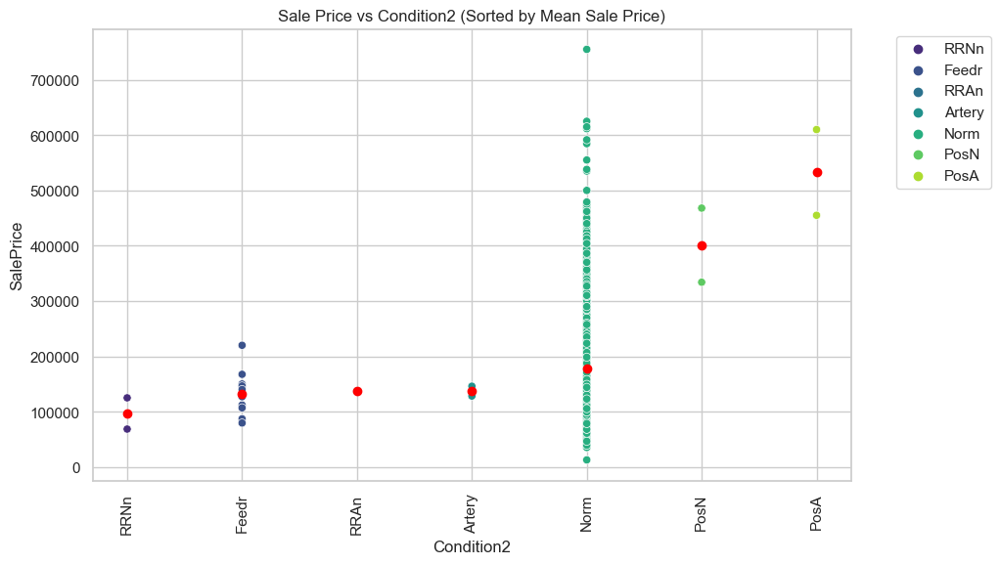

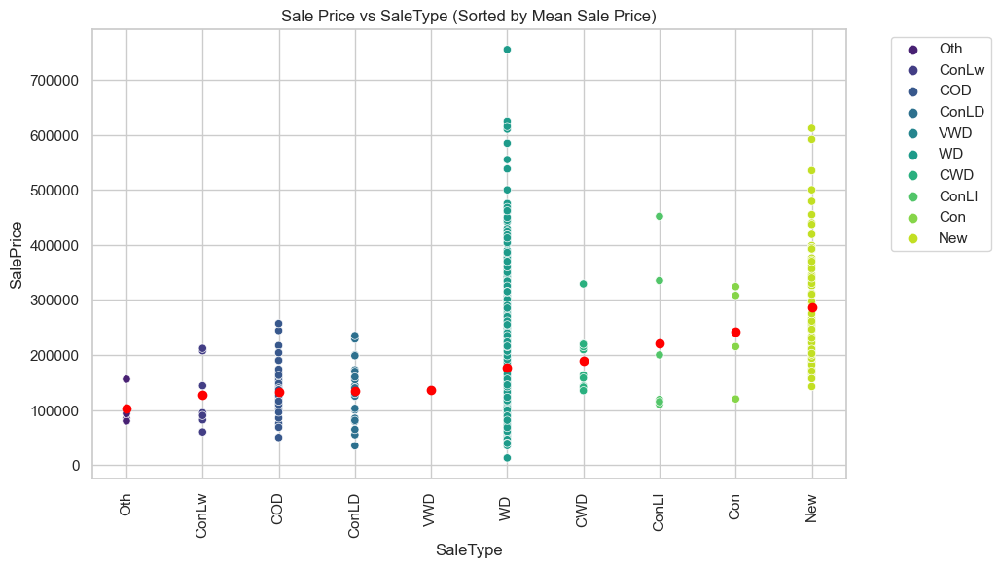

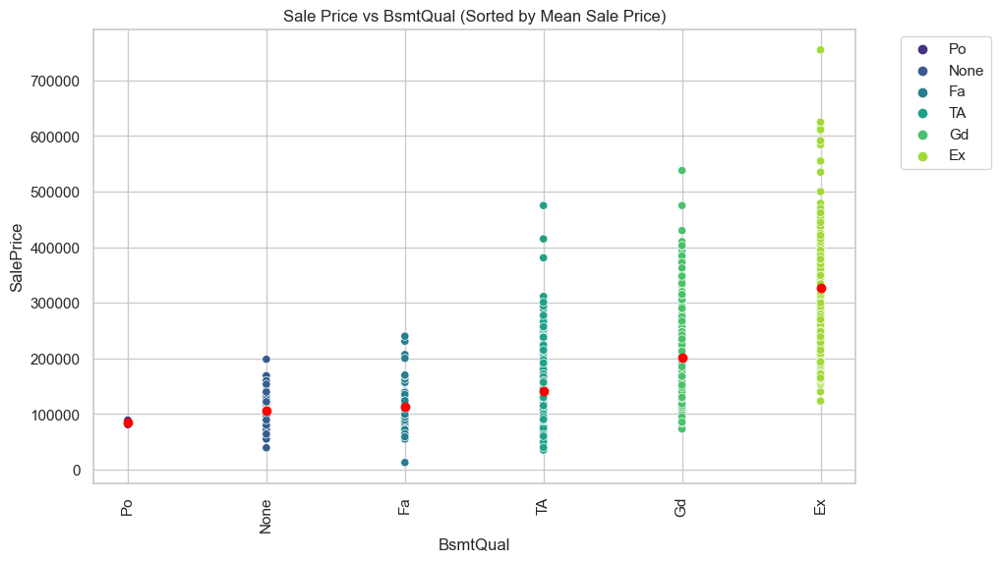

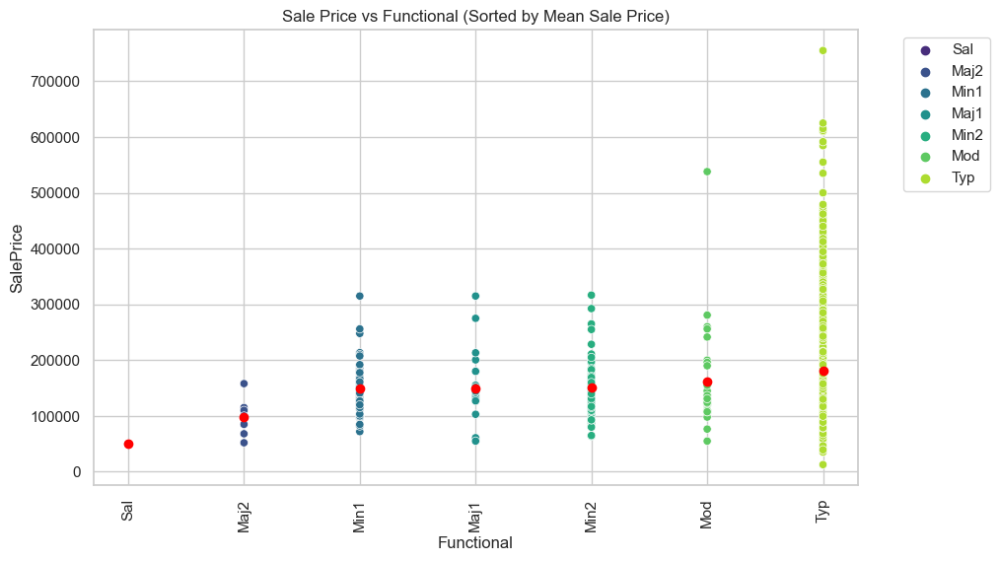

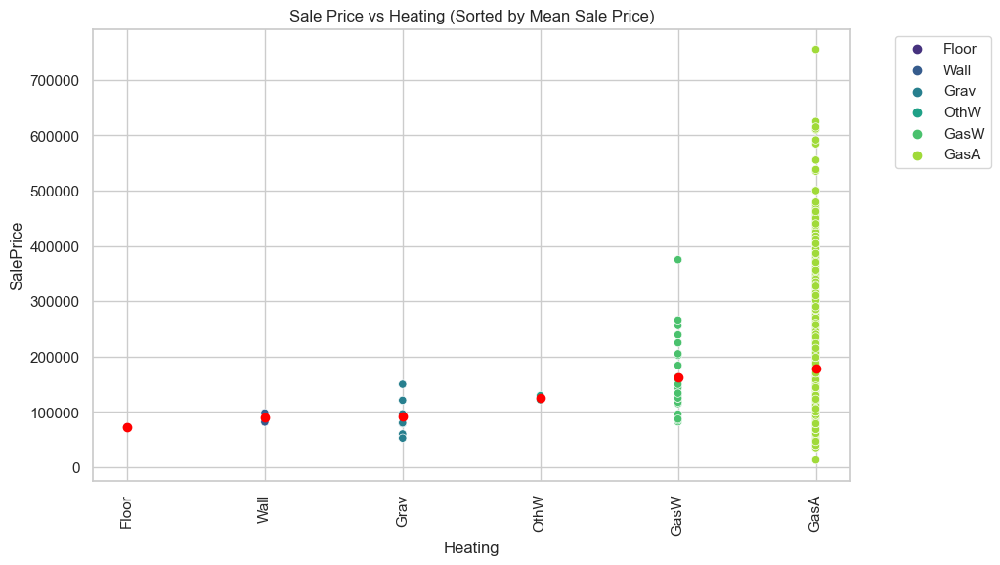

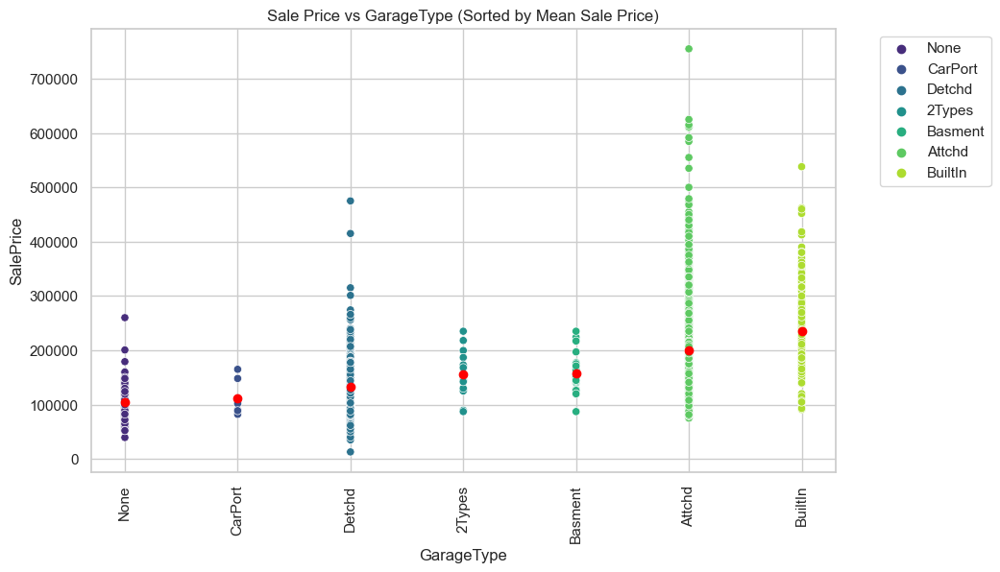

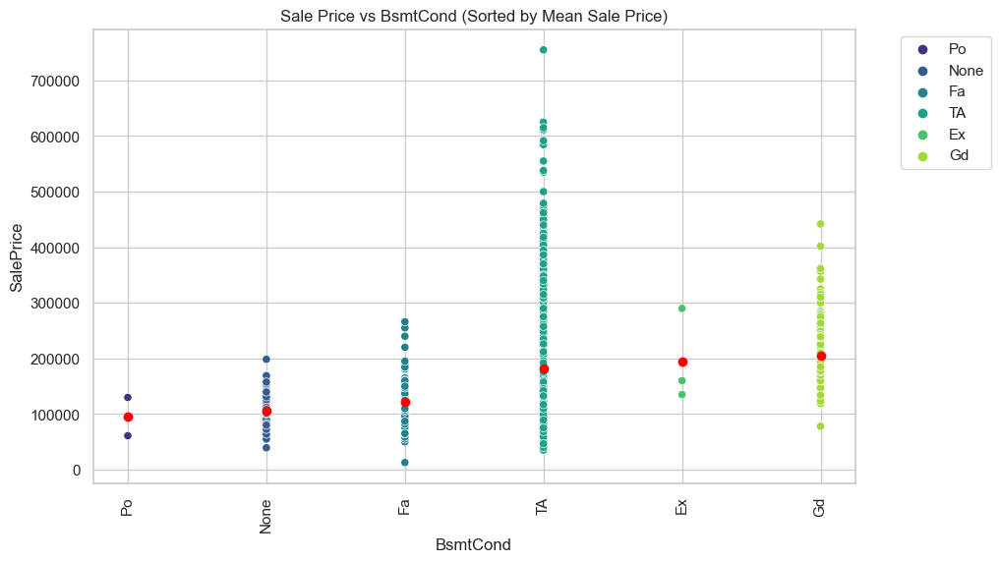

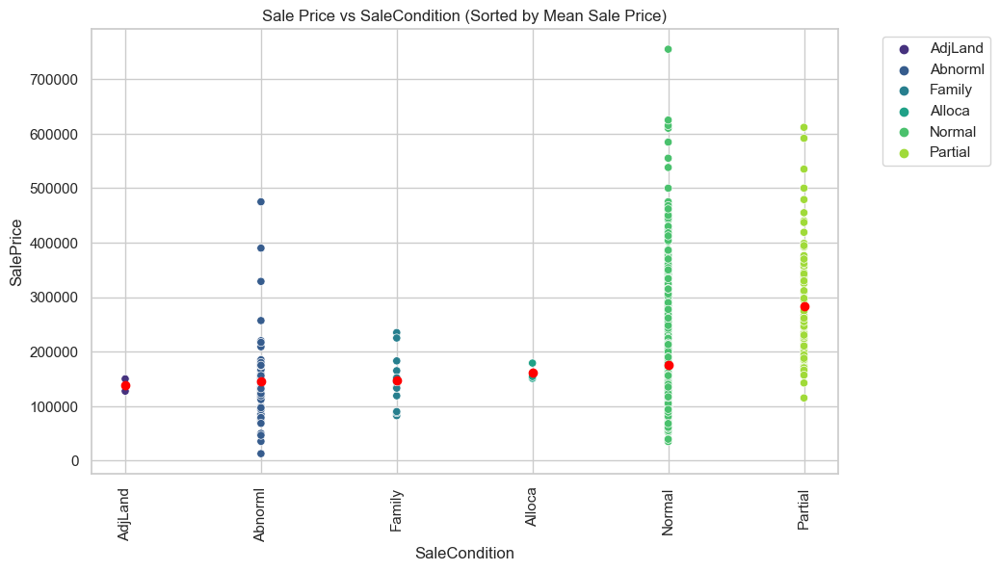

In [419]:
for cat_col in sorted_columns_categorical[:10]:
    mean_prices = housing_coords.groupby(cat_col)['SalePrice'].mean().sort_values()
    housing_coords_sorted = housing_coords.sort_values(by=cat_col, key=lambda x: x.map(mean_prices))
    
    plt.figure(figsize=(10, 6))
    sns.set(style="whitegrid")
    sns.scatterplot(x=cat_col, y='SalePrice', data=housing_coords_sorted, hue=cat_col, palette='viridis')
    plt.scatter(mean_prices.index, mean_prices, color='red', marker='o')

    plt.title(f'Sale Price vs {cat_col} (Sorted by Mean Sale Price)')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=90)
    plt.show()

# Price/SF vs Size

In [420]:
housing_coords.PricePerSF

0       147.196262
1       132.983794
2       124.775225
3       109.720885
4       136.336336
           ...    
2492    127.100840
2493     80.553953
2494     72.427572
2495    118.078176
2496    112.506541
Name: PricePerSF, Length: 2497, dtype: float64

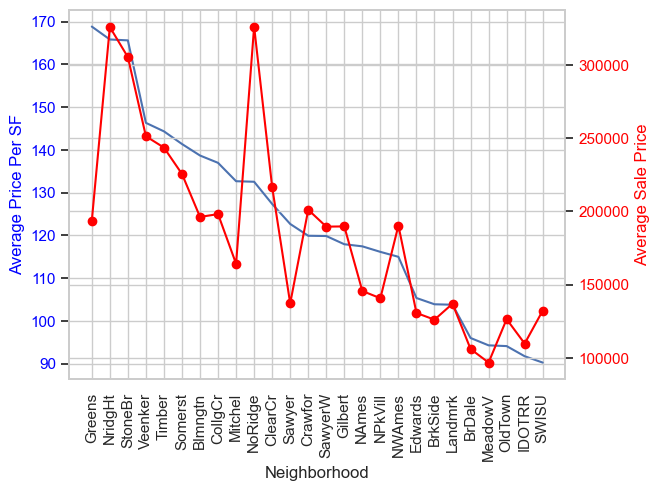

In [423]:
neighborhood_df = housing_coords.groupby('Neighborhood').agg(
    {'PricePerSF': 'mean', 'SalePrice': 'mean'}).reset_index()

neighborhood_df = neighborhood_df.sort_values(by='PricePerSF', ascending=False)

# Set up the figure and axes
fig, ax1 = plt.subplots()

# Plot Count on the left y-axis
ax1.plot(neighborhood_df['Neighborhood'], neighborhood_df['PricePerSF'])
ax1.set_ylabel('Average Price Per SF', color='blue')
ax1.set_xlabel('Neighborhood')
ax1.tick_params(axis='y', labelcolor='blue')

# Create a second y-axis for DistanceToISU
ax2 = ax1.twinx()
ax2.plot(neighborhood_df['Neighborhood'], neighborhood_df['SalePrice'], color='red', marker='o')
ax2.set_ylabel('Average Sale Price', color='red')
ax2.tick_params(axis='y', labelcolor='red')

# Rotate x-axis labels by 90 degrees
ax1.tick_params(axis='x', rotation=90)

# Show the plot
plt.show()

Greens, NoRidge are farr off the line but the rest follow pretty closely.

In [440]:
# Create a Folium map centered at the mean of coordinates
map_center = [0.5 * (housing_coords['latitude'].max() + housing_coords['latitude'].min()),
              0.5 * (housing_coords['longitude'].max() + housing_coords['longitude'].min())]
mymap = folium.Map(location=map_center, zoom_start=12.5)

# Get quartile ranges for 'SalePrice'
quartiles = np.percentile(housing_coords['SalePrice'], [25, 50, 75])
min_value, max_value = housing_coords['SalePrice'].min(), housing_coords['SalePrice'].max()

# Assign colors based on quartile ranges
def assign_color(price):
    if price <= quartiles[0]:
        return 'blue'
    elif price <= quartiles[1]:
        return 'green'
    elif price <= quartiles[2]:
        return 'orange'
    else:
        return 'red'

# Create a custom legend
legend_html = f"""
    <div style="position: fixed; bottom: 50px; left: 50px; z-index:1000; font-size:14px;">
        <p><span style="background-color: blue; border-radius: 50%; padding: 5px 10px;"></span>&nbsp;1st Quartile (Min: {min_value}, Max: {quartiles[0]})</p>
        <p><span style="background-color: green; border-radius: 50%; padding: 5px 10px;"></span>&nbsp;2nd Quartile (Min: {quartiles[0]}, Max: {quartiles[1]})</p>
        <p><span style="background-color: orange; border-radius: 50%; padding: 5px 10px;"></span>&nbsp;3rd Quartile (Min: {quartiles[1]}, Max: {quartiles[2]})</p>
        <p><span style="background-color: red; border-radius: 50%; padding: 5px 10px;"></span>&nbsp;4th Quartile (Min: {quartiles[2]}, Max: {max_value})</p>
    </div>
"""

mymap.get_root().html.add_child(folium.Element(legend_html))

# Iterate through the DataFrame and add markers to the map
for index, row in housing_coords.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=2,
        color=assign_color(row['SalePrice']),
        fill=True,
        fill_color=assign_color(row['SalePrice']),
        fill_opacity=0.7,
        popup=row['Neighborhood'],
    ).add_to(mymap)

# Display the map directly in the Jupyter Notebook
display(mymap)

In [435]:
# Create a Folium map centered at the mean of coordinates
map_center = [0.5 * (housing_coords['latitude'].max() + housing_coords['latitude'].min()),
              0.5 * (housing_coords['longitude'].max() + housing_coords['longitude'].min())]
mymap = folium.Map(location=map_center, zoom_start=13.25)

# Get unique neighborhoods from the DataFrame
neighborhoods = list(housing_coords['Neighborhood'].unique())

# Define a color dictionary with random colors for each neighborhood
color_dict = {neighborhood: "#{:06x}".format(random.randint(0, 0xFFFFFF)) for neighborhood in neighborhoods}

# Create a custom legend
legend_html = """
    <div style="position: fixed; bottom: 50px; left: 50px; z-index:1000; font-size:14px;">
        <p style="color: gray;">Legend</p>
"""

for neighborhood, color in color_dict.items():
    legend_html += f"""
        <p><span style="background-color: {color}; border-radius: 50%; padding: 5px 5px;"></span>&nbsp;{neighborhood}</p>
    """

legend_html += "</div>"

mymap.get_root().html.add_child(folium.Element(legend_html))

# Iterate through the DataFrame and add markers to the map
for index, row in housing_coords.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=2,
        color=color_dict.get(row['Neighborhood'], 'gray'),
        fill=True,
        fill_color=color_dict.get(row['Neighborhood'], 'gray'),
        popup=row['Neighborhood'],
    ).add_to(mymap)

# Display the map directly in the Jupyter Notebook
display(mymap)

In [28]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

# Split the dataset into a training set and a test set
X = housing_coords[['GarageArea']]  # Feature(s)
y = housing_coords[['SalePrice']]  # Target variable
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)  # 80% train, 20% test

# Create a Linear Regression model
lm = LinearRegression()

# Fit the model with the training data
lm.fit(X_train, y_train)

# Print the coefficients and intercept
print("Coefficient:", lm.coef_)
print("Intercept:", lm.intercept_)

# Make predictions on the test set
y_pred = lm.predict(X_test)

# Calculate the R-squared score
r2_score = lm.score(X_test, y_test)
print("R-squared:", r2_score)


Coefficient: [[237.20457049]]
Intercept: [67513.35712606]
R-squared: 0.3976483333076949


In [36]:
for i in sorted_corrs.index[:10]:
    # Split the dataset into a training set and a test set
    X = housing_coords[[i]]  # Feature(s)
    y = housing_coords[['SalePrice']]  # Target variable
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)  # 80% train, 20% test

    # Create a Linear Regression model
    lm = LinearRegression()

    # Fit the model with the training data
    lm.fit(X_train, y_train)

    # Print the coefficients and intercept
#     print("Coefficient:", lm.coef_)
#     print("Intercept:", lm.intercept_)

    # Make predictions on the test set
    y_pred = lm.predict(X_test)

    # Calculate the R-squared score
    r2_score = lm.score(X_test, y_test)
    print(i)
    print("R-squared:", r2_score,'\n')

OverallQual
R-squared: 0.6051802286986979 

GrLivArea
R-squared: 0.4730303791982675 

TotalBsmtSF
R-squared: 0.44640246996413324 

1stFlrSF
R-squared: 0.41808102243737955 

GarageCars
R-squared: 0.4095256245974921 

GarageArea
R-squared: 0.3976483333076949 

MiscRmsAbvGrd
R-squared: 0.33333486428682957 

Bath
R-squared: 0.37202040186298013 

PricePerSF
R-squared: 0.3059583644294498 

GarageYrBlt
R-squared: 0.24669539073168711 

